In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
import gc
from tqdm import tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
os.chdir('../../')
os.getcwd()

'/home/bunny/projects/IConNet'

In [5]:
from IConNet.acov.audio_vqvae import VqVaeClsLoss
from IConNet.trainer.train_torch import get_dataloader
from IConNet.trainer.train_torch import Trainer_SCB10 as Trainer
from IConNet.acov.model import SCB7 as SCB
from omegaconf import OmegaConf as ocf

In [6]:
dataset_name = 'iemocap'
experiment_prefix = "scb7"
log_dir = f'../{experiment_prefix}_models/{dataset_name}/'
data_dir = "../data/data_preprocessed/"
dataset_config_path = f'config/dataset/{dataset_name}4.yaml'
dataset_config = ocf.load(dataset_config_path)
print(dataset_config)
batch_size = 2

{'name': 'iemocap', 'dataset_class': 'WaveformDataset', 'root': 'iemocap/', 'audio_dir': 'full_release/', 'feature_dir': 'preprocessing/', 'label_name': 'label4', 'feature_name': 'audio16k', 'num_classes': 4, 'label_values': ['neu', 'hap', 'sad', 'ang'], 'classnames': ['neu', 'hap', 'sad', 'ang'], 'target_labels': ['ang', 'neu', 'sad', 'hap']}


In [7]:
train_loader, test_loader, batch_size = get_dataloader(
    dataset_config, data_dir, batch_size=batch_size)

In [8]:
loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.15)
trainer = Trainer(batch_size=batch_size, log_dir=log_dir, 
                  experiment_prefix=experiment_prefix, device=device,
                 accumulate_grad_batches=8)
trainer.prepare(train_loader=train_loader, 
                test_loader=test_loader, 
                batch_size=batch_size,
               loss_ratio=loss_ratio)

In [9]:
in_channels = 1
out_channels = 8
embedding_dim = 1023
num_embeddings = 384
commitment_cost = 0.25
learning_rate = 1e-4
num_tokens = 256
num_classes = 4

In [10]:
codebook_pretrained_path = f'../scb7_models/ravdess/codebook.step=10000.pt'
model = SCB(
    in_channels=in_channels,
    out_channels=out_channels,
    num_embeddings=num_embeddings, 
    embedding_dim=embedding_dim, 
    num_tokens=num_tokens,
    num_classes=num_classes, 
    cls_dim=embedding_dim,
    sample_rate=16000,
    commitment_cost=commitment_cost,
    distance_type='euclidean',
    codebook_pretrained_path=codebook_pretrained_path,
    freeze_codebook=False,
    loss_type='signal_loss',
)

In [11]:
trainer.setup(model=model, lr=learning_rate)

In [12]:
trainer.fit(
    n_epoch=100, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=10)

  0%|▏                                                  | 0.476833976833989/100 [06:59<610:13:12, 22073.17s/it]

Epoch: 1	Loss: 19.490 [perplexity=5.187, loss_vq=19.216, loss_recon=0.097, loss_cls=1.179]	Val_acc: 97/197 (49.24%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=1.step=864.loss=19.490.val_acc=0.492.pt


  1%|▊                                                    | 1.4295366795367364/100 [18:29<17:28:56, 638.50s/it]

Correct: 484/988 (0.4899)
Saved new best test model: ../scb7_models/iemocap/model.epoch=1.step=1727.test_acc=0.4899.pt
{'acc_unweighted': tensor(0.4601, device='cuda:0'),
 'acc_weighted': tensor(0.4899, device='cuda:0'),
 'f1s_unweighted': tensor(0.4493, device='cuda:0'),
 'f1s_weighted': tensor(0.4634, device='cuda:0'),
 'rocauc': tensor(0.7675, device='cuda:0'),
 'uar': tensor(0.4601, device='cuda:0'),
 'wap': tensor(0.5523, device='cuda:0')}
{'acc_detail': tensor([0.1222, 0.7076, 0.5300, 0.4808], device='cuda:0'),
 'f1s_detail': tensor([0.2077, 0.5661, 0.6101, 0.4132], device='cuda:0'),
 'precision_detail': tensor([0.6923, 0.4717, 0.7188, 0.3623], device='cuda:0'),
 'recall_detail': tensor([0.1222, 0.7076, 0.5300, 0.4808], device='cuda:0'),
 'rocauc_detail': tensor([0.7646, 0.6918, 0.8978, 0.7158], device='cuda:0')}
tensor([[ 27,  86,   3, 105],
        [  0, 242,  34,  66],
        [  0,  97, 115,   5],
        [ 12,  88,   8, 100]], device='cuda:0')


  2%|▉                                                 | 1.9063706563707945/100 [25:33<615:21:38, 22583.51s/it]

Epoch: 2	Loss: 26.187 [perplexity=5.657, loss_vq=25.836, loss_recon=0.193, loss_cls=1.053]	Val_acc: 99/197 (50.25%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=2.step=2591.loss=26.187.val_acc=0.503.pt


  3%|█▍                                                | 2.8590733590736597/100 [39:04<611:51:27, 22675.17s/it]

Epoch: 3	Loss: 56.410 [perplexity=14.672, loss_vq=56.037, loss_recon=0.178, loss_cls=1.295]	Val_acc: 102/197 (51.78%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=3.step=4318.loss=56.410.val_acc=0.518.pt


  4%|█▉                                                 | 3.811776061776525/100 [52:39<609:56:57, 22828.35s/it]

Epoch: 4	Loss: 42.627 [perplexity=13.454, loss_vq=42.275, loss_recon=0.226, loss_cls=0.843]	Val_acc: 104/197 (52.79%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=4.step=6045.loss=42.627.val_acc=0.528.pt


  5%|██▍                                               | 4.76447876447939/100 [1:06:18<603:50:29, 22825.82s/it]

Epoch: 5	Loss: 24.421 [perplexity=7.493, loss_vq=24.014, loss_recon=0.217, loss_cls=1.266]	Val_acc: 98/197 (49.75%)



  6%|██▊                                              | 5.717181467182255/100 [1:20:05<608:28:44, 23233.55s/it]

Epoch: 6	Loss: 48.513 [perplexity=11.941, loss_vq=48.180, loss_recon=0.257, loss_cls=0.513]	Val_acc: 95/197 (48.22%)



  7%|███▎                                              | 6.66988416988512/100 [1:33:49<599:59:16, 23143.19s/it]

Epoch: 7	Loss: 32.642 [perplexity=6.830, loss_vq=32.307, loss_recon=0.224, loss_cls=0.744]	Val_acc: 103/197 (52.28%)



  8%|███▋                                             | 7.622586872587985/100 [1:47:37<594:44:57, 23177.72s/it]

Epoch: 8	Loss: 19.679 [perplexity=13.021, loss_vq=19.378, loss_recon=0.266, loss_cls=0.229]	Val_acc: 110/197 (55.84%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=8.step=12953.loss=19.679.val_acc=0.558.pt


  9%|████▎                                             | 8.57528957529085/100 [2:01:26<587:29:45, 23133.63s/it]

Epoch: 9	Loss: 58.562 [perplexity=10.375, loss_vq=58.070, loss_recon=0.274, loss_cls=1.454]	Val_acc: 108/197 (54.82%)



 10%|████▋                                            | 9.527992277993715/100 [2:15:17<578:38:00, 23024.59s/it]

Epoch: 10	Loss: 67.325 [perplexity=11.314, loss_vq=67.028, loss_recon=0.223, loss_cls=0.494]	Val_acc: 110/197 (55.84%)



 10%|█████▏                                           | 10.48069498069658/100 [2:29:14<582:01:48, 23406.22s/it]

Epoch: 11	Loss: 8.894 [perplexity=5.657, loss_vq=8.596, loss_recon=0.169, loss_cls=0.861]	Val_acc: 93/197 (47.21%)



 11%|█████▊                                             | 11.433397683399445/100 [2:41:17<16:33:16, 672.90s/it]

Correct: 535/988 (0.5415)
Saved new best test model: ../scb7_models/iemocap/model.epoch=11.step=18997.test_acc=0.5415.pt
{'acc_unweighted': tensor(0.5475, device='cuda:0'),
 'acc_weighted': tensor(0.5415, device='cuda:0'),
 'f1s_unweighted': tensor(0.5107, device='cuda:0'),
 'f1s_weighted': tensor(0.5144, device='cuda:0'),
 'rocauc': tensor(0.8134, device='cuda:0'),
 'uar': tensor(0.5475, device='cuda:0'),
 'wap': tensor(0.5423, device='cuda:0')}
{'acc_detail': tensor([0.6652, 0.4708, 0.8618, 0.1923], device='cuda:0'),
 'f1s_detail': tensor([0.5868, 0.5210, 0.6561, 0.2787], device='cuda:0'),
 'precision_detail': tensor([0.5250, 0.5833, 0.5297, 0.5063], device='cuda:0'),
 'recall_detail': tensor([0.6652, 0.4708, 0.8618, 0.1923], device='cuda:0'),
 'rocauc_detail': tensor([0.8350, 0.7626, 0.9022, 0.7538], device='cuda:0')}
tensor([[147,  31,  23,  20],
        [ 51, 161, 111,  19],
        [  8,  22, 187,   0],
        [ 74,  62,  32,  40]], device='cuda:0')


 12%|█████▋                                          | 11.910231660233503/100 [2:48:36<573:03:32, 23419.44s/it]

Epoch: 12	Loss: 9.688 [perplexity=6.830, loss_vq=9.304, loss_recon=0.193, loss_cls=1.275]	Val_acc: 101/197 (51.27%)



 13%|██████▏                                         | 12.862934362936368/100 [3:02:40<569:54:15, 23545.15s/it]

Epoch: 13	Loss: 21.513 [perplexity=14.672, loss_vq=21.225, loss_recon=0.218, loss_cls=0.462]	Val_acc: 100/197 (50.76%)



 14%|██████▋                                         | 13.815637065639233/100 [3:16:45<562:04:09, 23478.15s/it]

Epoch: 14	Loss: 54.196 [perplexity=13.021, loss_vq=53.585, loss_recon=0.161, loss_cls=2.994]	Val_acc: 99/197 (50.25%)



 15%|███████                                         | 14.768339768342098/100 [3:30:49<559:15:46, 23622.05s/it]

Epoch: 15	Loss: 10.065 [perplexity=5.657, loss_vq=9.778, loss_recon=0.225, loss_cls=0.411]	Val_acc: 100/197 (50.76%)



 16%|███████▌                                        | 15.721042471044964/100 [3:45:00<556:05:08, 23753.36s/it]

Epoch: 16	Loss: 11.532 [perplexity=6.830, loss_vq=11.295, loss_recon=0.150, loss_cls=0.573]	Val_acc: 97/197 (49.24%)



 17%|████████▏                                        | 16.67374517374783/100 [3:59:11<554:56:07, 23975.25s/it]

Epoch: 17	Loss: 19.564 [perplexity=8.136, loss_vq=19.170, loss_recon=0.203, loss_cls=1.275]	Val_acc: 105/197 (53.30%)



 18%|████████▍                                       | 17.626447876450694/100 [4:13:27<549:20:51, 24008.33s/it]

Epoch: 18	Loss: 16.162 [perplexity=6.830, loss_vq=15.816, loss_recon=0.176, loss_cls=1.139]	Val_acc: 103/197 (52.28%)



 19%|█████████                                        | 18.57915057915356/100 [4:27:49<545:48:47, 24132.98s/it]

Epoch: 19	Loss: 24.815 [perplexity=7.493, loss_vq=24.537, loss_recon=0.135, loss_cls=0.950]	Val_acc: 110/197 (55.84%)



 20%|█████████▍                                      | 19.531853281856424/100 [4:42:12<541:29:28, 24225.35s/it]

Epoch: 20	Loss: 36.524 [perplexity=8.172, loss_vq=36.283, loss_recon=0.186, loss_cls=0.365]	Val_acc: 107/197 (54.31%)



 20%|██████████                                       | 20.48455598455929/100 [4:56:39<534:38:52, 24205.77s/it]

Epoch: 21	Loss: 25.162 [perplexity=8.172, loss_vq=24.930, loss_recon=0.167, loss_cls=0.432]	Val_acc: 109/197 (55.33%)



 21%|██████████▉                                        | 21.437258687262155/100 [5:09:07<15:23:07, 705.01s/it]

Correct: 571/988 (0.5779)
Saved new best test model: ../scb7_models/iemocap/model.epoch=21.step=36267.test_acc=0.5779.pt
{'acc_unweighted': tensor(0.5661, device='cuda:0'),
 'acc_weighted': tensor(0.5779, device='cuda:0'),
 'f1s_unweighted': tensor(0.5635, device='cuda:0'),
 'f1s_weighted': tensor(0.5698, device='cuda:0'),
 'rocauc': tensor(0.8124, device='cuda:0'),
 'uar': tensor(0.5661, device='cuda:0'),
 'wap': tensor(0.5836, device='cuda:0')}
{'acc_detail': tensor([0.4661, 0.6491, 0.7696, 0.3798], device='cuda:0'),
 'f1s_detail': tensor([0.5583, 0.6041, 0.6588, 0.4329], device='cuda:0'),
 'precision_detail': tensor([0.6959, 0.5649, 0.5759, 0.5032], device='cuda:0'),
 'recall_detail': tensor([0.4661, 0.6491, 0.7696, 0.3798], device='cuda:0'),
 'rocauc_detail': tensor([0.8503, 0.7713, 0.8962, 0.7317], device='cuda:0')}
tensor([[103,  56,  16,  46],
        [ 15, 222,  75,  30],
        [  1,  47, 167,   2],
        [ 29,  68,  32,  79]], device='cuda:0')


 22%|██████████▌                                     | 21.914092664096213/100 [5:16:45<530:27:55, 24456.09s/it]

Epoch: 22	Loss: 36.783 [perplexity=6.830, loss_vq=36.595, loss_recon=0.102, loss_cls=0.576]	Val_acc: 96/197 (48.73%)



 23%|██████████▉                                     | 22.866795366799078/100 [5:31:17<526:18:19, 24563.99s/it]

Epoch: 23	Loss: 8.422 [perplexity=8.172, loss_vq=8.133, loss_recon=0.188, loss_cls=0.675]	Val_acc: 110/197 (55.84%)



 24%|███████████▍                                    | 23.819498069501943/100 [5:45:53<521:40:12, 24652.14s/it]

Epoch: 24	Loss: 16.728 [perplexity=9.514, loss_vq=16.290, loss_recon=0.231, loss_cls=1.381]	Val_acc: 93/197 (47.21%)



 25%|████████████▏                                    | 24.77220077220481/100 [6:00:29<514:54:03, 24640.40s/it]

Epoch: 25	Loss: 9.131 [perplexity=6.830, loss_vq=8.661, loss_recon=0.171, loss_cls=1.994]	Val_acc: 96/197 (48.73%)



 26%|████████████▎                                   | 25.724903474907673/100 [6:15:09<509:35:19, 24698.98s/it]

Epoch: 26	Loss: 15.177 [perplexity=4.649, loss_vq=14.772, loss_recon=0.235, loss_cls=1.133]	Val_acc: 105/197 (53.30%)



 27%|█████████████                                    | 26.67760617761054/100 [6:29:50<506:13:27, 24854.71s/it]

Epoch: 27	Loss: 11.833 [perplexity=8.172, loss_vq=11.526, loss_recon=0.147, loss_cls=1.061]	Val_acc: 103/197 (52.28%)



 28%|█████████████▎                                  | 27.630308880313404/100 [6:44:37<503:47:53, 25061.23s/it]

Epoch: 28	Loss: 14.787 [perplexity=5.657, loss_vq=14.577, loss_recon=0.186, loss_cls=0.162]	Val_acc: 103/197 (52.28%)



 29%|██████████████                                   | 28.58301158301627/100 [6:59:32<501:59:24, 25304.40s/it]

Epoch: 29	Loss: 11.911 [perplexity=8.172, loss_vq=11.608, loss_recon=0.187, loss_cls=0.772]	Val_acc: 104/197 (52.79%)



 30%|██████████████▏                                 | 29.535714285719134/100 [7:14:22<492:04:06, 25139.63s/it]

Epoch: 30	Loss: 22.932 [perplexity=14.672, loss_vq=22.664, loss_recon=0.165, loss_cls=0.689]	Val_acc: 106/197 (53.81%)



 30%|███████████████▌                                   | 30.488416988422/100 [7:29:20<489:41:35, 25361.18s/it]

Epoch: 31	Loss: 22.698 [perplexity=6.830, loss_vq=22.275, loss_recon=0.163, loss_cls=1.739]	Val_acc: 106/197 (53.81%)



 31%|████████████████                                   | 31.441119691124864/100 [7:42:18<14:03:59, 738.63s/it]

Correct: 504/988 (0.5101)
{'acc_unweighted': tensor(0.5180, device='cuda:0'),
 'acc_weighted': tensor(0.5101, device='cuda:0'),
 'f1s_unweighted': tensor(0.4941, device='cuda:0'),
 'f1s_weighted': tensor(0.4967, device='cuda:0'),
 'rocauc': tensor(0.7877, device='cuda:0'),
 'uar': tensor(0.5180, device='cuda:0'),
 'wap': tensor(0.5467, device='cuda:0')}
{'acc_detail': tensor([0.3575, 0.4503, 0.8940, 0.3702], device='cuda:0'),
 'f1s_detail': tensor([0.4661, 0.5091, 0.5897, 0.4118], device='cuda:0'),
 'precision_detail': tensor([0.6695, 0.5856, 0.4399, 0.4639], device='cuda:0'),
 'recall_detail': tensor([0.3575, 0.4503, 0.8940, 0.3702], device='cuda:0'),
 'rocauc_detail': tensor([0.7953, 0.7178, 0.9033, 0.7345], device='cuda:0')}
tensor([[ 79,  35,  46,  61],
        [ 14, 154, 146,  28],
        [  3,  20, 194,   0],
        [ 22,  54,  55,  77]], device='cuda:0')


 32%|███████████████▎                                | 31.917953667958923/100 [7:50:07<475:20:27, 25134.78s/it]

Epoch: 32	Loss: 12.443 [perplexity=14.672, loss_vq=12.120, loss_recon=0.181, loss_cls=0.942]	Val_acc: 109/197 (55.33%)



 33%|███████████████▊                                | 32.870656370661784/100 [8:05:14<480:31:01, 25769.08s/it]

Epoch: 33	Loss: 31.355 [perplexity=4.649, loss_vq=31.081, loss_recon=0.132, loss_cls=0.951]	Val_acc: 103/197 (52.28%)



 34%|████████████████▌                                | 33.82335907336465/100 [8:20:16<468:10:44, 25468.87s/it]

Epoch: 34	Loss: 21.274 [perplexity=9.676, loss_vq=20.994, loss_recon=0.200, loss_cls=0.530]	Val_acc: 107/197 (54.31%)



 35%|████████████████▋                               | 34.776061776067515/100 [8:35:22<466:33:57, 25751.85s/it]

Epoch: 35	Loss: 8.145 [perplexity=5.657, loss_vq=7.600, loss_recon=0.236, loss_cls=2.060]	Val_acc: 104/197 (52.79%)



 36%|█████████████████▌                               | 35.72876447877038/100 [8:50:36<457:54:44, 25648.86s/it]

Epoch: 36	Loss: 18.783 [perplexity=9.676, loss_vq=18.238, loss_recon=0.148, loss_cls=2.649]	Val_acc: 83/197 (42.13%)



 37%|█████████████████▌                              | 36.681467181473245/100 [9:05:50<455:02:33, 25871.63s/it]

Epoch: 37	Loss: 13.793 [perplexity=13.454, loss_vq=13.445, loss_recon=0.158, loss_cls=1.260]	Val_acc: 108/197 (54.82%)



 38%|██████████████████▍                              | 37.63416988417611/100 [9:21:09<447:58:09, 25858.54s/it]

Epoch: 38	Loss: 7.469 [perplexity=14.672, loss_vq=7.131, loss_recon=0.168, loss_cls=1.134]	Val_acc: 109/197 (55.33%)



 39%|██████████████████▌                             | 38.586872586878975/100 [9:36:32<443:19:34, 25987.52s/it]

Epoch: 39	Loss: 23.417 [perplexity=10.950, loss_vq=23.155, loss_recon=0.174, loss_cls=0.593]	Val_acc: 111/197 (56.35%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=39.step=66490.loss=23.417.val_acc=0.563.pt


 40%|███████████████████▎                             | 39.53957528958184/100 [9:51:55<438:55:10, 26134.63s/it]

Epoch: 40	Loss: 6.214 [perplexity=5.187, loss_vq=5.703, loss_recon=0.167, loss_cls=2.287]	Val_acc: 97/197 (49.24%)



 40%|███████████████████                            | 40.492277992284706/100 [10:07:20<430:45:24, 26059.21s/it]

Epoch: 41	Loss: 32.863 [perplexity=9.514, loss_vq=32.246, loss_recon=0.216, loss_cls=2.677]	Val_acc: 108/197 (54.82%)



 41%|█████████████████████▏                             | 41.44498069498757/100 [10:20:44<12:22:01, 760.33s/it]

Correct: 554/988 (0.5607)
{'acc_unweighted': tensor(0.5369, device='cuda:0'),
 'acc_weighted': tensor(0.5607, device='cuda:0'),
 'f1s_unweighted': tensor(0.5508, device='cuda:0'),
 'f1s_weighted': tensor(0.5577, device='cuda:0'),
 'rocauc': tensor(0.8005, device='cuda:0'),
 'uar': tensor(0.5369, device='cuda:0'),
 'wap': tensor(0.5805, device='cuda:0')}
{'acc_detail': tensor([0.5339, 0.7135, 0.5300, 0.3702], device='cuda:0'),
 'f1s_detail': tensor([0.5606, 0.5951, 0.6336, 0.4140], device='cuda:0'),
 'precision_detail': tensor([0.5900, 0.5105, 0.7877, 0.4695], device='cuda:0'),
 'recall_detail': tensor([0.5339, 0.7135, 0.5300, 0.3702], device='cuda:0'),
 'rocauc_detail': tensor([0.8090, 0.7331, 0.9017, 0.7582], device='cuda:0')}
tensor([[118,  67,   4,  32],
        [ 29, 244,  23,  46],
        [  6,  87, 115,   9],
        [ 47,  80,   4,  77]], device='cuda:0')


 42%|████████████████████                            | 41.92181467182163/100 [10:28:49<421:08:12, 26104.34s/it]

Epoch: 42	Loss: 8.649 [perplexity=7.493, loss_vq=8.246, loss_recon=0.191, loss_cls=1.410]	Val_acc: 104/197 (52.79%)



 43%|████████████████████▏                          | 42.874517374524494/100 [10:44:23<419:35:21, 26442.17s/it]

Epoch: 43	Loss: 13.655 [perplexity=4.649, loss_vq=13.171, loss_recon=0.187, loss_cls=1.982]	Val_acc: 90/197 (45.69%)



 44%|█████████████████████                           | 43.82722007722736/100 [10:59:57<407:01:29, 26085.40s/it]

Epoch: 44	Loss: 27.651 [perplexity=13.021, loss_vq=26.661, loss_recon=0.164, loss_cls=5.505]	Val_acc: 100/197 (50.76%)



 45%|█████████████████████                          | 44.779922779930224/100 [11:15:34<408:08:38, 26608.41s/it]

Epoch: 45	Loss: 12.487 [perplexity=5.743, loss_vq=12.235, loss_recon=0.170, loss_cls=0.551]	Val_acc: 98/197 (49.75%)



 46%|█████████████████████▉                          | 45.73262548263309/100 [11:31:12<399:21:58, 26493.24s/it]

Epoch: 46	Loss: 125.401 [perplexity=4.649, loss_vq=125.167, loss_recon=0.189, loss_cls=0.301]	Val_acc: 102/197 (51.78%)



 47%|█████████████████████▉                         | 46.685328185335955/100 [11:46:55<393:43:49, 26586.10s/it]

Epoch: 47	Loss: 17.614 [perplexity=4.263, loss_vq=17.349, loss_recon=0.229, loss_cls=0.239]	Val_acc: 97/197 (49.24%)



 48%|██████████████████████▊                         | 47.63803088803882/100 [12:02:42<388:33:55, 26714.72s/it]

Epoch: 48	Loss: 15.835 [perplexity=8.873, loss_vq=15.515, loss_recon=0.152, loss_cls=1.122]	Val_acc: 104/197 (52.79%)



 49%|██████████████████████▊                        | 48.590733590741685/100 [12:18:32<385:06:43, 26967.96s/it]

Epoch: 49	Loss: 7.347 [perplexity=5.657, loss_vq=6.915, loss_recon=0.235, loss_cls=1.311]	Val_acc: 97/197 (49.24%)



 50%|███████████████████████▊                        | 49.54343629344455/100 [12:34:27<378:52:59, 27032.75s/it]

Epoch: 50	Loss: 7.884 [perplexity=4.649, loss_vq=7.421, loss_recon=0.190, loss_cls=1.823]	Val_acc: 99/197 (50.25%)



 50%|█████████████████████████▏                        | 50.32915057915897/100 [12:47:00<14:14:47, 1032.54s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7bdb346d21c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7bdb346d21c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 50%|█████████████████████████▏                        | 50.329633204641596/100 [12:47:01<12:36:58, 914.40s/it]


RuntimeError: DataLoader worker (pid(s) 536968, 536984, 537000, 537016, 537032, 537048, 537064, 537080) exited unexpectedly

In [13]:
trainer.fit(
    n_epoch=50, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=1)

  1%|▎                                                  | 0.3335584064821085/50 [08:43<562:19:20, 40759.13s/it]

Epoch: 52	Loss: 31.759 [perplexity=6.830, loss_vq=31.461, loss_recon=0.221, loss_cls=0.515]	Val_acc: 107/197 (54.31%)



  2%|█                                                    | 0.9999999999999617/50 [23:18<16:07:44, 1185.00s/it]

Correct: 575/988 (0.5820)
Saved new best test model: ../scb7_models/iemocap/model.epoch=52.step=88639.test_acc=0.5820.pt
{'acc_unweighted': tensor(0.5678, device='cuda:0'),
 'acc_weighted': tensor(0.5820, device='cuda:0'),
 'f1s_unweighted': tensor(0.5688, device='cuda:0'),
 'f1s_weighted': tensor(0.5747, device='cuda:0'),
 'rocauc': tensor(0.8034, device='cuda:0'),
 'uar': tensor(0.5678, device='cuda:0'),
 'wap': tensor(0.5897, device='cuda:0')}
{'acc_detail': tensor([0.7376, 0.6579, 0.5346, 0.3413], device='cuda:0'),
 'f1s_detail': tensor([0.6430, 0.6016, 0.6237, 0.4069], device='cuda:0'),
 'precision_detail': tensor([0.5699, 0.5542, 0.7484, 0.5035], device='cuda:0'),
 'recall_detail': tensor([0.7376, 0.6579, 0.5346, 0.3413], device='cuda:0'),
 'rocauc_detail': tensor([0.8496, 0.7627, 0.8899, 0.7115], device='cuda:0')}
tensor([[163,  37,   3,  18],
        [ 44, 225,  30,  43],
        [  7,  85, 116,   9],
        [ 72,  59,   6,  71]], device='cuda:0')


  3%|█▎                                                 | 1.3335584064820347/50 [32:07<555:22:59, 41083.33s/it]

Epoch: 53	Loss: 5.423 [perplexity=5.657, loss_vq=4.970, loss_recon=0.185, loss_cls=1.784]	Val_acc: 103/197 (52.28%)



  4%|██                                                   | 1.9999999999998606/50 [46:49<16:14:11, 1217.74s/it]

Correct: 545/988 (0.5516)
{'acc_unweighted': tensor(0.5398, device='cuda:0'),
 'acc_weighted': tensor(0.5516, device='cuda:0'),
 'f1s_unweighted': tensor(0.5322, device='cuda:0'),
 'f1s_weighted': tensor(0.5396, device='cuda:0'),
 'rocauc': tensor(0.7960, device='cuda:0'),
 'uar': tensor(0.5398, device='cuda:0'),
 'wap': tensor(0.5483, device='cuda:0')}
{'acc_detail': tensor([0.5566, 0.6140, 0.7097, 0.2788], device='cuda:0'),
 'f1s_detail': tensor([0.5503, 0.5785, 0.6351, 0.3648], device='cuda:0'),
 'precision_detail': tensor([0.5442, 0.5469, 0.5746, 0.5273], device='cuda:0'),
 'recall_detail': tensor([0.5566, 0.6140, 0.7097, 0.2788], device='cuda:0'),
 'rocauc_detail': tensor([0.7926, 0.7562, 0.8878, 0.7475], device='cuda:0')}
tensor([[123,  50,  16,  32],
        [ 36, 210,  77,  19],
        [  5,  57, 154,   1],
        [ 62,  67,  21,  58]], device='cuda:0')


  5%|██▍                                                | 2.3335584064819335/50 [55:37<546:31:08, 41275.77s/it]

Epoch: 54	Loss: 11.220 [perplexity=13.021, loss_vq=10.964, loss_recon=0.192, loss_cls=0.422]	Val_acc: 96/197 (48.73%)



  6%|███                                                | 2.9999999999997593/50 [1:10:29<15:46:56, 1208.87s/it]

Correct: 566/988 (0.5729)
{'acc_unweighted': tensor(0.5500, device='cuda:0'),
 'acc_weighted': tensor(0.5729, device='cuda:0'),
 'f1s_unweighted': tensor(0.5630, device='cuda:0'),
 'f1s_weighted': tensor(0.5691, device='cuda:0'),
 'rocauc': tensor(0.7945, device='cuda:0'),
 'uar': tensor(0.5500, device='cuda:0'),
 'wap': tensor(0.6024, device='cuda:0')}
{'acc_detail': tensor([0.5430, 0.7281, 0.4194, 0.5096], device='cuda:0'),
 'f1s_detail': tensor([0.5839, 0.6073, 0.5449, 0.5158], device='cuda:0'),
 'precision_detail': tensor([0.6316, 0.5209, 0.7778, 0.5222], device='cuda:0'),
 'recall_detail': tensor([0.5430, 0.7281, 0.4194, 0.5096], device='cuda:0'),
 'rocauc_detail': tensor([0.7911, 0.7473, 0.8767, 0.7629], device='cuda:0')}
tensor([[120,  51,   4,  46],
        [ 33, 249,  18,  42],
        [  8, 109,  91,   9],
        [ 29,  69,   4, 106]], device='cuda:0')


  7%|███▎                                              | 3.333558406481832/50 [1:19:21<542:25:49, 41844.83s/it]

Epoch: 55	Loss: 26.823 [perplexity=5.657, loss_vq=26.575, loss_recon=0.150, loss_cls=0.652]	Val_acc: 101/197 (51.27%)



  8%|████▏                                               | 3.999999999999658/50 [1:34:15<15:41:19, 1227.81s/it]

Correct: 484/988 (0.4899)
{'acc_unweighted': tensor(0.4771, device='cuda:0'),
 'acc_weighted': tensor(0.4899, device='cuda:0'),
 'f1s_unweighted': tensor(0.4774, device='cuda:0'),
 'f1s_weighted': tensor(0.4848, device='cuda:0'),
 'rocauc': tensor(0.7542, device='cuda:0'),
 'uar': tensor(0.4771, device='cuda:0'),
 'wap': tensor(0.5547, device='cuda:0')}
{'acc_detail': tensor([0.3575, 0.5936, 0.3180, 0.6394], device='cuda:0'),
 'f1s_detail': tensor([0.4413, 0.5370, 0.4554, 0.4758], device='cuda:0'),
 'precision_detail': tensor([0.5766, 0.4903, 0.8023, 0.3789], device='cuda:0'),
 'recall_detail': tensor([0.3575, 0.5936, 0.3180, 0.6394], device='cuda:0'),
 'rocauc_detail': tensor([0.7284, 0.6978, 0.8762, 0.7144], device='cuda:0')}
tensor([[ 79,  44,   5,  93],
        [ 30, 203,  12,  97],
        [  2, 118,  69,  28],
        [ 26,  49,   0, 133]], device='cuda:0')


  9%|████▎                                             | 4.333558406481731/50 [1:43:06<522:36:42, 41198.80s/it]

Epoch: 56	Loss: 11.160 [perplexity=11.941, loss_vq=10.932, loss_recon=0.180, loss_cls=0.319]	Val_acc: 104/197 (52.79%)



 10%|█████▏                                              | 4.999999999999557/50 [1:58:01<15:18:41, 1224.91s/it]

Correct: 544/988 (0.5506)
{'acc_unweighted': tensor(0.5606, device='cuda:0'),
 'acc_weighted': tensor(0.5506, device='cuda:0'),
 'f1s_unweighted': tensor(0.5422, device='cuda:0'),
 'f1s_weighted': tensor(0.5425, device='cuda:0'),
 'rocauc': tensor(0.7926, device='cuda:0'),
 'uar': tensor(0.5606, device='cuda:0'),
 'wap': tensor(0.5609, device='cuda:0')}
{'acc_detail': tensor([0.7557, 0.4591, 0.6912, 0.3365], device='cuda:0'),
 'f1s_detail': tensor([0.5849, 0.5313, 0.6711, 0.3815], device='cuda:0'),
 'precision_detail': tensor([0.4771, 0.6305, 0.6522, 0.4403], device='cuda:0'),
 'recall_detail': tensor([0.7557, 0.4591, 0.6912, 0.3365], device='cuda:0'),
 'rocauc_detail': tensor([0.8266, 0.7559, 0.8981, 0.6897], device='cuda:0')}
tensor([[167,  18,  10,  26],
        [ 76, 157,  57,  52],
        [ 15,  41, 150,  11],
        [ 92,  33,  13,  70]], device='cuda:0')


 11%|█████▍                                             | 5.33355840648163/50 [2:06:55<521:34:56, 42038.19s/it]

Epoch: 57	Loss: 5.669 [perplexity=4.649, loss_vq=5.326, loss_recon=0.113, loss_cls=1.533]	Val_acc: 104/197 (52.79%)



 12%|██████                                             | 5.9999999999994555/50 [2:21:52<15:02:20, 1230.46s/it]

Correct: 560/988 (0.5668)
{'acc_unweighted': tensor(0.5665, device='cuda:0'),
 'acc_weighted': tensor(0.5668, device='cuda:0'),
 'f1s_unweighted': tensor(0.5631, device='cuda:0'),
 'f1s_weighted': tensor(0.5637, device='cuda:0'),
 'rocauc': tensor(0.7883, device='cuda:0'),
 'uar': tensor(0.5665, device='cuda:0'),
 'wap': tensor(0.5626, device='cuda:0')}
{'acc_detail': tensor([0.5566, 0.5585, 0.7327, 0.4183], device='cuda:0'),
 'f1s_detail': tensor([0.5721, 0.5585, 0.6824, 0.4394], device='cuda:0'),
 'precision_detail': tensor([0.5885, 0.5585, 0.6386, 0.4628], device='cuda:0'),
 'recall_detail': tensor([0.5566, 0.5585, 0.7327, 0.4183], device='cuda:0'),
 'rocauc_detail': tensor([0.7987, 0.7466, 0.8936, 0.7142], device='cuda:0')}
tensor([[123,  44,   6,  48],
        [ 33, 191,  74,  44],
        [  5,  44, 159,   9],
        [ 48,  63,  10,  87]], device='cuda:0')


 13%|██████▏                                          | 6.3335584064815285/50 [2:30:50<510:31:08, 42088.81s/it]

Epoch: 58	Loss: 92.411 [perplexity=4.649, loss_vq=92.075, loss_recon=0.187, loss_cls=0.993]	Val_acc: 98/197 (49.75%)



 14%|███████▎                                            | 6.999999999999354/50 [2:45:53<14:45:16, 1235.27s/it]

Correct: 556/988 (0.5628)
{'acc_unweighted': tensor(0.5271, device='cuda:0'),
 'acc_weighted': tensor(0.5628, device='cuda:0'),
 'f1s_unweighted': tensor(0.5268, device='cuda:0'),
 'f1s_weighted': tensor(0.5417, device='cuda:0'),
 'rocauc': tensor(0.7876, device='cuda:0'),
 'uar': tensor(0.5271, device='cuda:0'),
 'wap': tensor(0.5880, device='cuda:0')}
{'acc_detail': tensor([0.6697, 0.7836, 0.4194, 0.2356], device='cuda:0'),
 'f1s_detail': tensor([0.6078, 0.6276, 0.5482, 0.3234], device='cuda:0'),
 'precision_detail': tensor([0.5564, 0.5234, 0.7913, 0.5158], device='cuda:0'),
 'recall_detail': tensor([0.6697, 0.7836, 0.4194, 0.2356], device='cuda:0'),
 'rocauc_detail': tensor([0.8277, 0.7556, 0.8801, 0.6871], device='cuda:0')}
tensor([[148,  51,   3,  19],
        [ 38, 268,  17,  19],
        [  9, 109,  91,   8],
        [ 71,  84,   4,  49]], device='cuda:0')


 15%|███████▎                                          | 7.333558406481427/50 [2:54:53<503:06:44, 42450.33s/it]

Epoch: 59	Loss: 35.461 [perplexity=8.172, loss_vq=35.187, loss_recon=0.206, loss_cls=0.452]	Val_acc: 103/197 (52.28%)



 16%|████████▎                                           | 7.999999999999253/50 [3:10:03<14:31:14, 1244.63s/it]

Correct: 545/988 (0.5516)
{'acc_unweighted': tensor(0.5307, device='cuda:0'),
 'acc_weighted': tensor(0.5516, device='cuda:0'),
 'f1s_unweighted': tensor(0.5405, device='cuda:0'),
 'f1s_weighted': tensor(0.5488, device='cuda:0'),
 'rocauc': tensor(0.7762, device='cuda:0'),
 'uar': tensor(0.5307, device='cuda:0'),
 'wap': tensor(0.5608, device='cuda:0')}
{'acc_detail': tensor([0.5158, 0.6871, 0.5161, 0.4038], device='cuda:0'),
 'f1s_detail': tensor([0.5340, 0.5987, 0.5973, 0.4319], device='cuda:0'),
 'precision_detail': tensor([0.5534, 0.5305, 0.7089, 0.4641], device='cuda:0'),
 'recall_detail': tensor([0.5158, 0.6871, 0.5161, 0.4038], device='cuda:0'),
 'rocauc_detail': tensor([0.7680, 0.7411, 0.8910, 0.7048], device='cuda:0')}
tensor([[114,  51,   7,  49],
        [ 34, 235,  30,  43],
        [  5,  95, 112,   5],
        [ 53,  62,   9,  84]], device='cuda:0')


 17%|████████▎                                         | 8.333558406482203/50 [3:19:05<486:39:07, 42046.97s/it]

Epoch: 60	Loss: 7.326 [perplexity=8.172, loss_vq=7.121, loss_recon=0.165, loss_cls=0.269]	Val_acc: 102/197 (51.78%)



 18%|█████████▎                                          | 9.000000000001782/50 [3:34:15<14:15:03, 1251.31s/it]

Correct: 581/988 (0.5881)
Saved new best test model: ../scb7_models/iemocap/model.epoch=60.step=102455.test_acc=0.5881.pt
{'acc_unweighted': tensor(0.5702, device='cuda:0'),
 'acc_weighted': tensor(0.5881, device='cuda:0'),
 'f1s_unweighted': tensor(0.5750, device='cuda:0'),
 'f1s_weighted': tensor(0.5805, device='cuda:0'),
 'rocauc': tensor(0.7907, device='cuda:0'),
 'uar': tensor(0.5702, device='cuda:0'),
 'wap': tensor(0.5926, device='cuda:0')}
{'acc_detail': tensor([0.6063, 0.6930, 0.6544, 0.3269], device='cuda:0'),
 'f1s_detail': tensor([0.5969, 0.6061, 0.6860, 0.4109], device='cuda:0'),
 'precision_detail': tensor([0.5877, 0.5386, 0.7208, 0.5528], device='cuda:0'),
 'recall_detail': tensor([0.6063, 0.6930, 0.6544, 0.3269], device='cuda:0'),
 'rocauc_detail': tensor([0.8155, 0.7560, 0.8997, 0.6916], device='cuda:0')}
tensor([[134,  58,   7,  22],
        [ 39, 237,  38,  28],
        [  5,  65, 142,   5],
        [ 50,  80,  10,  68]], device='cuda:0')


 19%|█████████▎                                        | 9.333558406484732/50 [3:43:15<477:26:42, 42265.88s/it]

Epoch: 61	Loss: 18.645 [perplexity=11.941, loss_vq=18.439, loss_recon=0.183, loss_cls=0.152]	Val_acc: 101/197 (51.27%)



 20%|██████████▏                                        | 10.000000000004311/50 [3:58:30<14:00:09, 1260.24s/it]

Correct: 552/988 (0.5587)
{'acc_unweighted': tensor(0.5628, device='cuda:0'),
 'acc_weighted': tensor(0.5587, device='cuda:0'),
 'f1s_unweighted': tensor(0.5629, device='cuda:0'),
 'f1s_weighted': tensor(0.5627, device='cuda:0'),
 'rocauc': tensor(0.7903, device='cuda:0'),
 'uar': tensor(0.5628, device='cuda:0'),
 'wap': tensor(0.5727, device='cuda:0')}
{'acc_detail': tensor([0.5973, 0.5263, 0.6037, 0.5240], device='cuda:0'),
 'f1s_detail': tensor([0.5752, 0.5538, 0.6566, 0.4658], device='cuda:0'),
 'precision_detail': tensor([0.5546, 0.5844, 0.7198, 0.4192], device='cuda:0'),
 'recall_detail': tensor([0.5973, 0.5263, 0.6037, 0.5240], device='cuda:0'),
 'rocauc_detail': tensor([0.7870, 0.7532, 0.8929, 0.7282], device='cuda:0')}
tensor([[132,  23,   4,  62],
        [ 52, 180,  40,  70],
        [  9,  58, 131,  19],
        [ 45,  47,   7, 109]], device='cuda:0')


 21%|██████████▏                                      | 10.333558406487262/50 [4:07:38<468:04:27, 42480.94s/it]

Epoch: 62	Loss: 13.661 [perplexity=9.676, loss_vq=13.514, loss_recon=0.118, loss_cls=0.195]	Val_acc: 102/197 (51.78%)



 22%|███████████▍                                        | 11.00000000000684/50 [4:22:50<13:43:27, 1266.87s/it]

Correct: 524/988 (0.5304)
{'acc_unweighted': tensor(0.5449, device='cuda:0'),
 'acc_weighted': tensor(0.5304, device='cuda:0'),
 'f1s_unweighted': tensor(0.5223, device='cuda:0'),
 'f1s_weighted': tensor(0.5187, device='cuda:0'),
 'rocauc': tensor(0.7758, device='cuda:0'),
 'uar': tensor(0.5449, device='cuda:0'),
 'wap': tensor(0.5369, device='cuda:0')}
{'acc_detail': tensor([0.5973, 0.4152, 0.8018, 0.3654], device='cuda:0'),
 'f1s_detail': tensor([0.5511, 0.4863, 0.6282, 0.4234], device='cuda:0'),
 'precision_detail': tensor([0.5116, 0.5868, 0.5163, 0.5033], device='cuda:0'),
 'recall_detail': tensor([0.5973, 0.4152, 0.8018, 0.3654], device='cuda:0'),
 'rocauc_detail': tensor([0.7763, 0.7341, 0.8864, 0.7064], device='cuda:0')}
tensor([[132,  26,  28,  35],
        [ 53, 142, 107,  40],
        [ 10,  33, 174,   0],
        [ 63,  41,  28,  76]], device='cuda:0')


 23%|███████████                                      | 11.333558406489791/50 [4:31:53<457:44:46, 42617.99s/it]

Epoch: 63	Loss: 7.387 [perplexity=5.657, loss_vq=6.977, loss_recon=0.190, loss_cls=1.461]	Val_acc: 93/197 (47.21%)



 24%|████████████▍                                       | 12.00000000000937/50 [4:47:15<13:20:44, 1264.32s/it]

Correct: 523/988 (0.5294)
{'acc_unweighted': tensor(0.4912, device='cuda:0'),
 'acc_weighted': tensor(0.5294, device='cuda:0'),
 'f1s_unweighted': tensor(0.4966, device='cuda:0'),
 'f1s_weighted': tensor(0.5103, device='cuda:0'),
 'rocauc': tensor(0.7676, device='cuda:0'),
 'uar': tensor(0.4912, device='cuda:0'),
 'wap': tensor(0.5612, device='cuda:0')}
{'acc_detail': tensor([0.5701, 0.7749, 0.3410, 0.2788], device='cuda:0'),
 'f1s_detail': tensor([0.5638, 0.5935, 0.4596, 0.3694], device='cuda:0'),
 'precision_detail': tensor([0.5575, 0.4809, 0.7048, 0.5472], device='cuda:0'),
 'recall_detail': tensor([0.5701, 0.7749, 0.3410, 0.2788], device='cuda:0'),
 'rocauc_detail': tensor([0.7810, 0.7315, 0.8601, 0.6979], device='cuda:0')}
tensor([[126,  61,   7,  27],
        [ 39, 265,  18,  20],
        [  2, 140,  74,   1],
        [ 59,  85,   6,  58]], device='cuda:0')


 25%|████████████▎                                     | 12.33355840649232/50 [4:56:25<447:07:28, 42734.27s/it]

Epoch: 64	Loss: 9.719 [perplexity=5.187, loss_vq=9.339, loss_recon=0.164, loss_cls=1.438]	Val_acc: 100/197 (50.76%)



 26%|█████████████▊                                       | 13.0000000000119/50 [5:11:46<13:03:23, 1270.36s/it]

Correct: 474/988 (0.4798)
{'acc_unweighted': tensor(0.4391, device='cuda:0'),
 'acc_weighted': tensor(0.4798, device='cuda:0'),
 'f1s_unweighted': tensor(0.4127, device='cuda:0'),
 'f1s_weighted': tensor(0.4326, device='cuda:0'),
 'rocauc': tensor(0.7585, device='cuda:0'),
 'uar': tensor(0.4391, device='cuda:0'),
 'wap': tensor(0.5214, device='cuda:0')}
{'acc_detail': tensor([0.6606, 0.7398, 0.1060, 0.2500], device='cuda:0'),
 'f1s_detail': tensor([0.5782, 0.5591, 0.1833, 0.3302], device='cuda:0'),
 'precision_detail': tensor([0.5141, 0.4494, 0.6765, 0.4860], device='cuda:0'),
 'recall_detail': tensor([0.6606, 0.7398, 0.1060, 0.2500], device='cuda:0'),
 'rocauc_detail': tensor([0.8172, 0.7090, 0.8295, 0.6785], device='cuda:0')}
tensor([[146,  54,   3,  18],
        [ 55, 253,   5,  29],
        [  8, 178,  23,   8],
        [ 75,  78,   3,  52]], device='cuda:0')


 27%|█████████████▎                                    | 13.33355840649485/50 [5:20:56<436:58:26, 42903.16s/it]

Epoch: 65	Loss: 5.443 [perplexity=6.830, loss_vq=5.078, loss_recon=0.268, loss_cls=0.643]	Val_acc: 99/197 (50.25%)



 28%|██████████████▌                                     | 14.00000000001443/50 [5:36:21<12:42:02, 1270.07s/it]

Correct: 560/988 (0.5668)
{'acc_unweighted': tensor(0.5572, device='cuda:0'),
 'acc_weighted': tensor(0.5668, device='cuda:0'),
 'f1s_unweighted': tensor(0.5592, device='cuda:0'),
 'f1s_weighted': tensor(0.5627, device='cuda:0'),
 'rocauc': tensor(0.7864, device='cuda:0'),
 'uar': tensor(0.5572, device='cuda:0'),
 'wap': tensor(0.5646, device='cuda:0')}
{'acc_detail': tensor([0.5204, 0.6228, 0.6866, 0.3990], device='cuda:0'),
 'f1s_detail': tensor([0.5476, 0.5796, 0.6608, 0.4486], device='cuda:0'),
 'precision_detail': tensor([0.5779, 0.5420, 0.6368, 0.5123], device='cuda:0'),
 'recall_detail': tensor([0.5204, 0.6228, 0.6866, 0.3990], device='cuda:0'),
 'rocauc_detail': tensor([0.7920, 0.7424, 0.8887, 0.7225], device='cuda:0')}
tensor([[115,  50,  15,  41],
        [ 34, 213,  59,  36],
        [  3,  63, 149,   2],
        [ 47,  67,  11,  83]], device='cuda:0')


 29%|██████████████▎                                   | 14.33355840649738/50 [5:45:30<425:26:42, 42942.41s/it]

Epoch: 66	Loss: 8.736 [perplexity=8.172, loss_vq=8.386, loss_recon=0.240, loss_cls=0.736]	Val_acc: 101/197 (51.27%)



 30%|███████████████▎                                   | 15.000000000016959/50 [6:00:59<12:19:27, 1267.64s/it]

Correct: 574/988 (0.5810)
{'acc_unweighted': tensor(0.5803, device='cuda:0'),
 'acc_weighted': tensor(0.5810, device='cuda:0'),
 'f1s_unweighted': tensor(0.5804, device='cuda:0'),
 'f1s_weighted': tensor(0.5802, device='cuda:0'),
 'rocauc': tensor(0.7961, device='cuda:0'),
 'uar': tensor(0.5803, device='cuda:0'),
 'wap': tensor(0.5802, device='cuda:0')}
{'acc_detail': tensor([0.5792, 0.5789, 0.6774, 0.4856], device='cuda:0'),
 'f1s_detail': tensor([0.5981, 0.5723, 0.6562, 0.4951], device='cuda:0'),
 'precision_detail': tensor([0.6184, 0.5657, 0.6364, 0.5050], device='cuda:0'),
 'recall_detail': tensor([0.5792, 0.5789, 0.6774, 0.4856], device='cuda:0'),
 'rocauc_detail': tensor([0.8199, 0.7494, 0.8856, 0.7297], device='cuda:0')}
tensor([[128,  39,  12,  42],
        [ 34, 198,  59,  51],
        [  3,  61, 147,   6],
        [ 42,  52,  13, 101]], device='cuda:0')


 31%|███████████████▎                                  | 15.33355840649991/50 [6:10:13<416:30:13, 43252.60s/it]

Epoch: 67	Loss: 17.737 [perplexity=8.873, loss_vq=17.474, loss_recon=0.160, loss_cls=0.688]	Val_acc: 95/197 (48.22%)



 32%|████████████████▎                                  | 16.000000000019487/50 [6:25:43<11:52:12, 1256.84s/it]

Correct: 539/988 (0.5455)
{'acc_unweighted': tensor(0.5452, device='cuda:0'),
 'acc_weighted': tensor(0.5455, device='cuda:0'),
 'f1s_unweighted': tensor(0.5331, device='cuda:0'),
 'f1s_weighted': tensor(0.5357, device='cuda:0'),
 'rocauc': tensor(0.7807, device='cuda:0'),
 'uar': tensor(0.5452, device='cuda:0'),
 'wap': tensor(0.5508, device='cuda:0')}
{'acc_detail': tensor([0.7240, 0.5234, 0.6498, 0.2837], device='cuda:0'),
 'f1s_detail': tensor([0.5735, 0.5400, 0.6558, 0.3631], device='cuda:0'),
 'precision_detail': tensor([0.4748, 0.5576, 0.6620, 0.5043], device='cuda:0'),
 'recall_detail': tensor([0.7240, 0.5234, 0.6498, 0.2837], device='cuda:0'),
 'rocauc_detail': tensor([0.8067, 0.7405, 0.8936, 0.6818], device='cuda:0')}
tensor([[160,  28,  11,  22],
        [ 78, 179,  52,  33],
        [ 11,  62, 141,   3],
        [ 88,  52,   9,  59]], device='cuda:0')


 33%|████████████████                                 | 16.333558406502437/50 [6:35:00<401:52:20, 42972.78s/it]

Epoch: 68	Loss: 15.824 [perplexity=8.172, loss_vq=15.566, loss_recon=0.164, loss_cls=0.624]	Val_acc: 96/197 (48.73%)



 34%|█████████████████▎                                 | 17.000000000022016/50 [6:50:32<11:44:39, 1281.19s/it]

Correct: 560/988 (0.5668)
{'acc_unweighted': tensor(0.5616, device='cuda:0'),
 'acc_weighted': tensor(0.5668, device='cuda:0'),
 'f1s_unweighted': tensor(0.5618, device='cuda:0'),
 'f1s_weighted': tensor(0.5651, device='cuda:0'),
 'rocauc': tensor(0.7886, device='cuda:0'),
 'uar': tensor(0.5616, device='cuda:0'),
 'wap': tensor(0.5721, device='cuda:0')}
{'acc_detail': tensor([0.4661, 0.5994, 0.7051, 0.4760], device='cuda:0'),
 'f1s_detail': tensor([0.5435, 0.5816, 0.6595, 0.4626], device='cuda:0'),
 'precision_detail': tensor([0.6519, 0.5647, 0.6194, 0.4500], device='cuda:0'),
 'recall_detail': tensor([0.4661, 0.5994, 0.7051, 0.4760], device='cuda:0'),
 'rocauc_detail': tensor([0.7784, 0.7439, 0.8881, 0.7438], device='cuda:0')}
tensor([[103,  46,  16,  56],
        [ 15, 205,  63,  59],
        [  4,  54, 153,   6],
        [ 36,  58,  15,  99]], device='cuda:0')


 35%|████████████████▉                                | 17.333558406504967/50 [6:59:46<393:23:53, 43354.40s/it]

Epoch: 69	Loss: 19.608 [perplexity=9.514, loss_vq=19.359, loss_recon=0.192, loss_cls=0.378]	Val_acc: 105/197 (53.30%)



 36%|██████████████████▎                                | 18.000000000024546/50 [7:15:21<11:23:43, 1281.99s/it]

Correct: 566/988 (0.5729)
{'acc_unweighted': tensor(0.5653, device='cuda:0'),
 'acc_weighted': tensor(0.5729, device='cuda:0'),
 'f1s_unweighted': tensor(0.5631, device='cuda:0'),
 'f1s_weighted': tensor(0.5674, device='cuda:0'),
 'rocauc': tensor(0.8042, device='cuda:0'),
 'uar': tensor(0.5653, device='cuda:0'),
 'wap': tensor(0.5701, device='cuda:0')}
{'acc_detail': tensor([0.5339, 0.6140, 0.7189, 0.3942], device='cuda:0'),
 'f1s_detail': tensor([0.5488, 0.5899, 0.6555, 0.4581], device='cuda:0'),
 'precision_detail': tensor([0.5646, 0.5676, 0.6023, 0.5467], device='cuda:0'),
 'recall_detail': tensor([0.5339, 0.6140, 0.7189, 0.3942], device='cuda:0'),
 'rocauc_detail': tensor([0.7973, 0.7677, 0.9011, 0.7507], device='cuda:0')}
tensor([[118,  48,  17,  38],
        [ 31, 210,  72,  29],
        [  8,  52, 156,   1],
        [ 52,  60,  14,  82]], device='cuda:0')


 37%|█████████████████▉                               | 18.333558406507496/50 [7:24:37<384:12:05, 43677.96s/it]

Epoch: 70	Loss: 22.664 [perplexity=5.657, loss_vq=22.353, loss_recon=0.187, loss_cls=0.827]	Val_acc: 110/197 (55.84%)



 38%|███████████████████▍                               | 19.000000000027075/50 [7:40:18<11:07:15, 1291.48s/it]

Correct: 525/988 (0.5314)
{'acc_unweighted': tensor(0.5259, device='cuda:0'),
 'acc_weighted': tensor(0.5314, device='cuda:0'),
 'f1s_unweighted': tensor(0.5275, device='cuda:0'),
 'f1s_weighted': tensor(0.5328, device='cuda:0'),
 'rocauc': tensor(0.7740, device='cuda:0'),
 'uar': tensor(0.5259, device='cuda:0'),
 'wap': tensor(0.5455, device='cuda:0')}
{'acc_detail': tensor([0.3937, 0.5760, 0.5760, 0.5577], device='cuda:0'),
 'f1s_detail': tensor([0.4508, 0.5677, 0.6219, 0.4696], device='cuda:0'),
 'precision_detail': tensor([0.5273, 0.5597, 0.6757, 0.4056], device='cuda:0'),
 'recall_detail': tensor([0.3937, 0.5760, 0.5760, 0.5577], device='cuda:0'),
 'rocauc_detail': tensor([0.7290, 0.7532, 0.8839, 0.7301], device='cuda:0')}
tensor([[ 87,  36,  10,  88],
        [ 38, 197,  43,  64],
        [  9,  65, 125,  18],
        [ 31,  54,   7, 116]], device='cuda:0')


 39%|██████████████████▉                              | 19.333558406510026/50 [7:49:36<370:19:10, 43472.63s/it]

Epoch: 71	Loss: 19.951 [perplexity=8.172, loss_vq=19.687, loss_recon=0.221, loss_cls=0.286]	Val_acc: 102/197 (51.78%)



 40%|████████████████████▍                              | 20.000000000029605/50 [8:05:17<10:48:33, 1297.12s/it]

Correct: 534/988 (0.5405)
{'acc_unweighted': tensor(0.5276, device='cuda:0'),
 'acc_weighted': tensor(0.5405, device='cuda:0'),
 'f1s_unweighted': tensor(0.5283, device='cuda:0'),
 'f1s_weighted': tensor(0.5339, device='cuda:0'),
 'rocauc': tensor(0.7655, device='cuda:0'),
 'uar': tensor(0.5276, device='cuda:0'),
 'wap': tensor(0.5399, device='cuda:0')}
{'acc_detail': tensor([0.4887, 0.6170, 0.6682, 0.3365], device='cuda:0'),
 'f1s_detail': tensor([0.5414, 0.5619, 0.6157, 0.3944], device='cuda:0'),
 'precision_detail': tensor([0.6067, 0.5159, 0.5709, 0.4762], device='cuda:0'),
 'recall_detail': tensor([0.4887, 0.6170, 0.6682, 0.3365], device='cuda:0'),
 'rocauc_detail': tensor([0.7778, 0.7210, 0.8662, 0.6970], device='cuda:0')}
tensor([[108,  51,  17,  45],
        [ 26, 211,  75,  30],
        [  6,  64, 145,   2],
        [ 38,  83,  17,  70]], device='cuda:0')


 41%|███████████████████▉                             | 20.333558406512555/50 [8:14:35<359:29:09, 43623.36s/it]

Epoch: 72	Loss: 43.023 [perplexity=12.338, loss_vq=42.861, loss_recon=0.094, loss_cls=0.453]	Val_acc: 93/197 (47.21%)



 42%|█████████████████████▍                             | 21.000000000032134/50 [8:30:21<10:35:48, 1315.47s/it]

Correct: 546/988 (0.5526)
{'acc_unweighted': tensor(0.5449, device='cuda:0'),
 'acc_weighted': tensor(0.5526, device='cuda:0'),
 'f1s_unweighted': tensor(0.5435, device='cuda:0'),
 'f1s_weighted': tensor(0.5478, device='cuda:0'),
 'rocauc': tensor(0.7809, device='cuda:0'),
 'uar': tensor(0.5449, device='cuda:0'),
 'wap': tensor(0.5500, device='cuda:0')}
{'acc_detail': tensor([0.5430, 0.5936, 0.6728, 0.3702], device='cuda:0'),
 'f1s_detail': tensor([0.5333, 0.5694, 0.6376, 0.4338], device='cuda:0'),
 'precision_detail': tensor([0.5240, 0.5472, 0.6058, 0.5238], device='cuda:0'),
 'recall_detail': tensor([0.5430, 0.5936, 0.6728, 0.3702], device='cuda:0'),
 'rocauc_detail': tensor([0.7680, 0.7537, 0.8791, 0.7230], device='cuda:0')}
tensor([[120,  48,  11,  42],
        [ 46, 203,  68,  25],
        [  9,  59, 146,   3],
        [ 54,  61,  16,  77]], device='cuda:0')


 43%|████████████████████▉                            | 21.333558406515085/50 [8:39:46<350:36:52, 44031.02s/it]

Epoch: 73	Loss: 16.082 [perplexity=5.187, loss_vq=15.701, loss_recon=0.074, loss_cls=2.052]	Val_acc: 103/197 (52.28%)



 44%|██████████████████████▍                            | 22.000000000034664/50 [8:55:35<10:08:26, 1303.80s/it]

Correct: 549/988 (0.5557)
{'acc_unweighted': tensor(0.5590, device='cuda:0'),
 'acc_weighted': tensor(0.5557, device='cuda:0'),
 'f1s_unweighted': tensor(0.5489, device='cuda:0'),
 'f1s_weighted': tensor(0.5493, device='cuda:0'),
 'rocauc': tensor(0.7946, device='cuda:0'),
 'uar': tensor(0.5590, device='cuda:0'),
 'wap': tensor(0.5515, device='cuda:0')}
{'acc_detail': tensor([0.6109, 0.5175, 0.7327, 0.3750], device='cuda:0'),
 'f1s_detail': tensor([0.5819, 0.5421, 0.6463, 0.4251], device='cuda:0'),
 'precision_detail': tensor([0.5556, 0.5691, 0.5782, 0.4906], device='cuda:0'),
 'recall_detail': tensor([0.6109, 0.5175, 0.7327, 0.3750], device='cuda:0'),
 'rocauc_detail': tensor([0.8205, 0.7484, 0.8919, 0.7175], device='cuda:0')}
tensor([[135,  32,  19,  35],
        [ 44, 177,  80,  41],
        [ 11,  42, 159,   5],
        [ 53,  60,  17,  78]], device='cuda:0')


 45%|█████████████████████▉                           | 22.333558406517614/50 [9:04:58<338:36:51, 44061.02s/it]

Epoch: 74	Loss: 12.805 [perplexity=9.676, loss_vq=12.557, loss_recon=0.187, loss_cls=0.409]	Val_acc: 110/197 (55.84%)



 46%|███████████████████████▉                            | 23.000000000037193/50 [9:20:49<9:49:43, 1310.52s/it]

Correct: 559/988 (0.5658)
{'acc_unweighted': tensor(0.5448, device='cuda:0'),
 'acc_weighted': tensor(0.5658, device='cuda:0'),
 'f1s_unweighted': tensor(0.5522, device='cuda:0'),
 'f1s_weighted': tensor(0.5609, device='cuda:0'),
 'rocauc': tensor(0.7708, device='cuda:0'),
 'uar': tensor(0.5448, device='cuda:0'),
 'wap': tensor(0.5716, device='cuda:0')}
{'acc_detail': tensor([0.4389, 0.7047, 0.6175, 0.4183], device='cuda:0'),
 'f1s_detail': tensor([0.5173, 0.6140, 0.6381, 0.4394], device='cuda:0'),
 'precision_detail': tensor([0.6299, 0.5440, 0.6601, 0.4628], device='cuda:0'),
 'recall_detail': tensor([0.4389, 0.7047, 0.6175, 0.4183], device='cuda:0'),
 'rocauc_detail': tensor([0.7517, 0.7486, 0.8779, 0.7050], device='cuda:0')}
tensor([[ 97,  51,   9,  64],
        [ 19, 241,  48,  34],
        [  4,  76, 134,   3],
        [ 34,  75,  12,  87]], device='cuda:0')


 47%|██████████████████████▊                          | 23.333558406520144/50 [9:30:14<326:11:50, 44037.00s/it]

Epoch: 75	Loss: 20.838 [perplexity=16.000, loss_vq=20.563, loss_recon=0.203, loss_cls=0.480]	Val_acc: 100/197 (50.76%)



 48%|████████████████████████▉                           | 24.000000000039723/50 [9:46:08<9:32:51, 1322.00s/it]

Correct: 555/988 (0.5617)
{'acc_unweighted': tensor(0.5490, device='cuda:0'),
 'acc_weighted': tensor(0.5617, device='cuda:0'),
 'f1s_unweighted': tensor(0.5564, device='cuda:0'),
 'f1s_weighted': tensor(0.5600, device='cuda:0'),
 'rocauc': tensor(0.7870, device='cuda:0'),
 'uar': tensor(0.5490, device='cuda:0'),
 'wap': tensor(0.5659, device='cuda:0')}
{'acc_detail': tensor([0.4977, 0.6433, 0.6221, 0.4327], device='cuda:0'),
 'f1s_detail': tensor([0.5486, 0.5782, 0.6383, 0.4604], device='cuda:0'),
 'precision_detail': tensor([0.6111, 0.5251, 0.6553, 0.4918], device='cuda:0'),
 'recall_detail': tensor([0.4977, 0.6433, 0.6221, 0.4327], device='cuda:0'),
 'rocauc_detail': tensor([0.7869, 0.7451, 0.8889, 0.7270], device='cuda:0')}
tensor([[110,  57,   8,  46],
        [ 25, 220,  53,  44],
        [  4,  75, 135,   3],
        [ 41,  67,  10,  90]], device='cuda:0')


 49%|███████████████████████▊                         | 24.333558406522673/50 [9:55:34<313:21:22, 43951.66s/it]

Epoch: 76	Loss: 9.474 [perplexity=5.558, loss_vq=9.202, loss_recon=0.205, loss_cls=0.451]	Val_acc: 110/197 (55.84%)



 50%|█████████████████████████▌                         | 25.000000000042252/50 [10:11:34<9:18:15, 1339.84s/it]

Correct: 590/988 (0.5972)
Saved new best test model: ../scb7_models/iemocap/model.epoch=76.step=130087.test_acc=0.5972.pt
{'acc_unweighted': tensor(0.5872, device='cuda:0'),
 'acc_weighted': tensor(0.5972, device='cuda:0'),
 'f1s_unweighted': tensor(0.5868, device='cuda:0'),
 'f1s_weighted': tensor(0.5907, device='cuda:0'),
 'rocauc': tensor(0.7994, device='cuda:0'),
 'uar': tensor(0.5872, device='cuda:0'),
 'wap': tensor(0.6001, device='cuda:0')}
{'acc_detail': tensor([0.7014, 0.6462, 0.6406, 0.3606], device='cuda:0'),
 'f1s_detail': tensor([0.6301, 0.6055, 0.6667, 0.4451], device='cuda:0'),
 'precision_detail': tensor([0.5720, 0.5696, 0.6950, 0.5814], device='cuda:0'),
 'recall_detail': tensor([0.7014, 0.6462, 0.6406, 0.3606], device='cuda:0'),
 'rocauc_detail': tensor([0.8323, 0.7618, 0.8893, 0.7141], device='cuda:0')}
tensor([[155,  43,   9,  14],
        [ 39, 221,  45,  37],
        [  7,  68, 139,   3],
        [ 70,  56,   7,  75]], device='cuda:0')


 51%|████████████████████████▎                       | 25.333558406525203/50 [10:21:05<304:21:23, 44420.00s/it]

Epoch: 77	Loss: 9.107 [perplexity=10.950, loss_vq=8.864, loss_recon=0.126, loss_cls=0.778]	Val_acc: 115/197 (58.38%)

Saved new best val model: ../scb7_models/iemocap/model.epoch=77.step=130951.loss=9.107.val_acc=0.584.pt


 52%|██████████████████████████▌                        | 26.000000000044782/50 [10:37:07<9:01:04, 1352.70s/it]

Correct: 534/988 (0.5405)
{'acc_unweighted': tensor(0.5223, device='cuda:0'),
 'acc_weighted': tensor(0.5405, device='cuda:0'),
 'f1s_unweighted': tensor(0.5164, device='cuda:0'),
 'f1s_weighted': tensor(0.5258, device='cuda:0'),
 'rocauc': tensor(0.7671, device='cuda:0'),
 'uar': tensor(0.5223, device='cuda:0'),
 'wap': tensor(0.5384, device='cuda:0')}
{'acc_detail': tensor([0.4706, 0.6491, 0.7097, 0.2596], device='cuda:0'),
 'f1s_detail': tensor([0.5161, 0.5781, 0.6286, 0.3429], device='cuda:0'),
 'precision_detail': tensor([0.5714, 0.5211, 0.5641, 0.5047], device='cuda:0'),
 'recall_detail': tensor([0.4706, 0.6491, 0.7097, 0.2596], device='cuda:0'),
 'rocauc_detail': tensor([0.7761, 0.7284, 0.8708, 0.6932], device='cuda:0')}
tensor([[104,  63,  22,  32],
        [ 26, 222,  76,  18],
        [  3,  57, 154,   3],
        [ 49,  84,  21,  54]], device='cuda:0')


 53%|█████████████████████████▎                      | 26.333558406527732/50 [10:46:42<293:08:02, 44589.83s/it]

Epoch: 78	Loss: 16.143 [perplexity=4.263, loss_vq=15.972, loss_recon=0.121, loss_cls=0.334]	Val_acc: 99/197 (50.25%)



 54%|████████████████████████████                        | 27.00000000004731/50 [11:02:46<8:28:12, 1325.76s/it]

Correct: 524/988 (0.5304)
{'acc_unweighted': tensor(0.5420, device='cuda:0'),
 'acc_weighted': tensor(0.5304, device='cuda:0'),
 'f1s_unweighted': tensor(0.5284, device='cuda:0'),
 'f1s_weighted': tensor(0.5249, device='cuda:0'),
 'rocauc': tensor(0.7829, device='cuda:0'),
 'uar': tensor(0.5420, device='cuda:0'),
 'wap': tensor(0.5394, device='cuda:0')}
{'acc_detail': tensor([0.7511, 0.4327, 0.5899, 0.3942], device='cuda:0'),
 'f1s_detail': tensor([0.5897, 0.4901, 0.6199, 0.4141], device='cuda:0'),
 'precision_detail': tensor([0.4854, 0.5649, 0.6531, 0.4362], device='cuda:0'),
 'recall_detail': tensor([0.7511, 0.4327, 0.5899, 0.3942], device='cuda:0'),
 'rocauc_detail': tensor([0.8156, 0.7309, 0.8798, 0.7054], device='cuda:0')}
tensor([[166,  24,   4,  27],
        [ 74, 148,  55,  65],
        [ 13,  62, 128,  14],
        [ 89,  28,   9,  82]], device='cuda:0')


 55%|██████████████████████████▏                     | 27.333558406530262/50 [11:12:21<281:26:34, 44700.20s/it]

Epoch: 79	Loss: 4.232 [perplexity=2.482, loss_vq=4.083, loss_recon=0.108, loss_cls=0.270]	Val_acc: 111/197 (56.35%)



 56%|█████████████████████████████                       | 28.00000000004984/50 [11:28:25<8:10:49, 1338.63s/it]

Correct: 561/988 (0.5678)
{'acc_unweighted': tensor(0.5522, device='cuda:0'),
 'acc_weighted': tensor(0.5678, device='cuda:0'),
 'f1s_unweighted': tensor(0.5459, device='cuda:0'),
 'f1s_weighted': tensor(0.5546, device='cuda:0'),
 'rocauc': tensor(0.7949, device='cuda:0'),
 'uar': tensor(0.5522, device='cuda:0'),
 'wap': tensor(0.5647, device='cuda:0')}
{'acc_detail': tensor([0.6335, 0.6520, 0.6590, 0.2644], device='cuda:0'),
 'f1s_detail': tensor([0.5920, 0.5995, 0.6384, 0.3537], device='cuda:0'),
 'precision_detail': tensor([0.5556, 0.5547, 0.6190, 0.5340], device='cuda:0'),
 'recall_detail': tensor([0.6335, 0.6520, 0.6590, 0.2644], device='cuda:0'),
 'rocauc_detail': tensor([0.8051, 0.7656, 0.8843, 0.7247], device='cuda:0')}
tensor([[140,  42,  15,  24],
        [ 42, 223,  56,  21],
        [  7,  64, 143,   3],
        [ 63,  73,  17,  55]], device='cuda:0')


 57%|███████████████████████████▊                     | 28.33355840653279/50 [11:38:00<272:12:14, 45228.22s/it]

Epoch: 80	Loss: 19.607 [perplexity=6.263, loss_vq=19.390, loss_recon=0.158, loss_cls=0.392]	Val_acc: 113/197 (57.36%)



 58%|██████████████████████████████▏                     | 29.00000000005237/50 [11:54:14<7:50:28, 1344.20s/it]

Correct: 535/988 (0.5415)
{'acc_unweighted': tensor(0.5146, device='cuda:0'),
 'acc_weighted': tensor(0.5415, device='cuda:0'),
 'f1s_unweighted': tensor(0.5225, device='cuda:0'),
 'f1s_weighted': tensor(0.5328, device='cuda:0'),
 'rocauc': tensor(0.7764, device='cuda:0'),
 'uar': tensor(0.5146, device='cuda:0'),
 'wap': tensor(0.5536, device='cuda:0')}
{'acc_detail': tensor([0.5520, 0.7105, 0.4931, 0.3029], device='cuda:0'),
 'f1s_detail': tensor([0.5410, 0.5927, 0.5847, 0.3717], device='cuda:0'),
 'precision_detail': tensor([0.5304, 0.5084, 0.7181, 0.4809], device='cuda:0'),
 'recall_detail': tensor([0.5520, 0.7105, 0.4931, 0.3029], device='cuda:0'),
 'rocauc_detail': tensor([0.7884, 0.7437, 0.8891, 0.6845], device='cuda:0')}
tensor([[122,  58,   4,  37],
        [ 41, 243,  32,  26],
        [  8,  97, 107,   5],
        [ 59,  80,   6,  63]], device='cuda:0')


 59%|████████████████████████████▋                    | 29.33355840653532/50 [12:03:51<259:17:45, 45168.17s/it]

Epoch: 81	Loss: 38.951 [perplexity=4.649, loss_vq=38.644, loss_recon=0.132, loss_cls=1.165]	Val_acc: 106/197 (53.81%)



 60%|███████████████████████████████▊                     | 30.0000000000549/50 [12:20:08<7:28:38, 1345.91s/it]

Correct: 565/988 (0.5719)
{'acc_unweighted': tensor(0.5712, device='cuda:0'),
 'acc_weighted': tensor(0.5719, device='cuda:0'),
 'f1s_unweighted': tensor(0.5639, device='cuda:0'),
 'f1s_weighted': tensor(0.5654, device='cuda:0'),
 'rocauc': tensor(0.7945, device='cuda:0'),
 'uar': tensor(0.5712, device='cuda:0'),
 'wap': tensor(0.5822, device='cuda:0')}
{'acc_detail': tensor([0.7557, 0.5556, 0.6129, 0.3606], device='cuda:0'),
 'f1s_detail': tensor([0.6062, 0.5655, 0.6364, 0.4478], device='cuda:0'),
 'precision_detail': tensor([0.5061, 0.5758, 0.6617, 0.5906], device='cuda:0'),
 'recall_detail': tensor([0.7557, 0.5556, 0.6129, 0.3606], device='cuda:0'),
 'rocauc_detail': tensor([0.8360, 0.7543, 0.8781, 0.7096], device='cuda:0')}
tensor([[167,  31,   6,  17],
        [ 67, 190,  55,  30],
        [ 14,  65, 133,   5],
        [ 82,  44,   7,  75]], device='cuda:0')


 61%|█████████████████████████████▋                   | 30.33355840653785/50 [12:29:49<246:55:51, 45201.43s/it]

Epoch: 82	Loss: 7.858 [perplexity=6.830, loss_vq=7.662, loss_recon=0.157, loss_cls=0.261]	Val_acc: 99/197 (50.25%)



 62%|████████████████████████████████▏                   | 31.00000000005743/50 [12:46:05<7:08:25, 1352.91s/it]

Correct: 563/988 (0.5698)
{'acc_unweighted': tensor(0.5484, device='cuda:0'),
 'acc_weighted': tensor(0.5698, device='cuda:0'),
 'f1s_unweighted': tensor(0.5505, device='cuda:0'),
 'f1s_weighted': tensor(0.5593, device='cuda:0'),
 'rocauc': tensor(0.7728, device='cuda:0'),
 'uar': tensor(0.5484, device='cuda:0'),
 'wap': tensor(0.5866, device='cuda:0')}
{'acc_detail': tensor([0.6923, 0.6959, 0.4977, 0.3077], device='cuda:0'),
 'f1s_detail': tensor([0.6036, 0.6071, 0.5902, 0.4013], device='cuda:0'),
 'precision_detail': tensor([0.5350, 0.5385, 0.7248, 0.5766], device='cuda:0'),
 'recall_detail': tensor([0.6923, 0.6959, 0.4977, 0.3077], device='cuda:0'),
 'rocauc_detail': tensor([0.7974, 0.7438, 0.8762, 0.6737], device='cuda:0')}
tensor([[153,  43,   3,  22],
        [ 51, 238,  33,  20],
        [ 16,  88, 108,   5],
        [ 66,  73,   5,  64]], device='cuda:0')


 63%|██████████████████████████████▋                  | 31.33355840654038/50 [12:55:45<234:56:54, 45312.05s/it]

Epoch: 83	Loss: 37.951 [perplexity=16.000, loss_vq=37.536, loss_recon=0.148, loss_cls=1.777]	Val_acc: 107/197 (54.31%)



 64%|████████████████████████████████▋                  | 32.000000000059956/50 [13:12:07<6:47:02, 1356.80s/it]

Correct: 540/988 (0.5466)
{'acc_unweighted': tensor(0.5464, device='cuda:0'),
 'acc_weighted': tensor(0.5466, device='cuda:0'),
 'f1s_unweighted': tensor(0.5344, device='cuda:0'),
 'f1s_weighted': tensor(0.5373, device='cuda:0'),
 'rocauc': tensor(0.7877, device='cuda:0'),
 'uar': tensor(0.5464, device='cuda:0'),
 'wap': tensor(0.5516, device='cuda:0')}
{'acc_detail': tensor([0.5023, 0.5351, 0.7972, 0.3510], device='cuda:0'),
 'f1s_detail': tensor([0.5401, 0.5495, 0.6234, 0.4244], device='cuda:0'),
 'precision_detail': tensor([0.5842, 0.5648, 0.5118, 0.5368], device='cuda:0'),
 'recall_detail': tensor([0.5023, 0.5351, 0.7972, 0.3510], device='cuda:0'),
 'rocauc_detail': tensor([0.7870, 0.7420, 0.8903, 0.7317], device='cuda:0')}
tensor([[111,  40,  29,  41],
        [ 31, 183, 107,  21],
        [  4,  39, 173,   1],
        [ 44,  62,  29,  73]], device='cuda:0')


 65%|███████████████████████████████                 | 32.333558406542906/50 [13:21:48<223:46:21, 45599.51s/it]

Epoch: 84	Loss: 12.704 [perplexity=9.676, loss_vq=12.504, loss_recon=0.174, loss_cls=0.172]	Val_acc: 94/197 (47.72%)



 66%|█████████████████████████████████▋                 | 33.000000000062485/50 [13:38:13<6:21:33, 1346.66s/it]

Correct: 514/988 (0.5202)
{'acc_unweighted': tensor(0.5179, device='cuda:0'),
 'acc_weighted': tensor(0.5202, device='cuda:0'),
 'f1s_unweighted': tensor(0.5018, device='cuda:0'),
 'f1s_weighted': tensor(0.5092, device='cuda:0'),
 'rocauc': tensor(0.7500, device='cuda:0'),
 'uar': tensor(0.5179, device='cuda:0'),
 'wap': tensor(0.5314, device='cuda:0')}
{'acc_detail': tensor([0.2715, 0.5439, 0.7419, 0.5144], device='cuda:0'),
 'f1s_detail': tensor([0.3670, 0.5611, 0.6228, 0.4563], device='cuda:0'),
 'precision_detail': tensor([0.5660, 0.5794, 0.5367, 0.4100], device='cuda:0'),
 'recall_detail': tensor([0.2715, 0.5439, 0.7419, 0.5144], device='cuda:0'),
 'rocauc_detail': tensor([0.6854, 0.7337, 0.8757, 0.7051], device='cuda:0')}
tensor([[ 60,  41,  25,  95],
        [ 18, 186,  82,  56],
        [  6,  47, 161,   3],
        [ 22,  47,  32, 107]], device='cuda:0')


 67%|████████████████████████████████                | 33.333558406545436/50 [13:47:57<209:40:49, 45291.55s/it]

Epoch: 85	Loss: 10.526 [perplexity=9.676, loss_vq=10.287, loss_recon=0.157, loss_cls=0.544]	Val_acc: 93/197 (47.21%)



 68%|██████████████████████████████████▋                | 34.000000000065015/50 [14:04:23<5:58:43, 1345.23s/it]

Correct: 546/988 (0.5526)
{'acc_unweighted': tensor(0.5587, device='cuda:0'),
 'acc_weighted': tensor(0.5526, device='cuda:0'),
 'f1s_unweighted': tensor(0.5289, device='cuda:0'),
 'f1s_weighted': tensor(0.5338, device='cuda:0'),
 'rocauc': tensor(0.7854, device='cuda:0'),
 'uar': tensor(0.5587, device='cuda:0'),
 'wap': tensor(0.5624, device='cuda:0')}
{'acc_detail': tensor([0.7240, 0.4825, 0.7880, 0.2404], device='cuda:0'),
 'f1s_detail': tensor([0.5829, 0.5518, 0.6539, 0.3268], device='cuda:0'),
 'precision_detail': tensor([0.4878, 0.6445, 0.5588, 0.5102], device='cuda:0'),
 'recall_detail': tensor([0.7240, 0.4825, 0.7880, 0.2404], device='cuda:0'),
 'rocauc_detail': tensor([0.8211, 0.7674, 0.8932, 0.6597], device='cuda:0')}
tensor([[160,  24,  19,  18],
        [ 60, 165,  91,  26],
        [ 16,  26, 171,   4],
        [ 92,  41,  25,  50]], device='cuda:0')


 69%|████████████████████████████████▉               | 34.333558406547965/50 [14:14:06<200:39:55, 46110.99s/it]

Epoch: 86	Loss: 18.526 [perplexity=6.830, loss_vq=18.181, loss_recon=0.192, loss_cls=1.024]	Val_acc: 93/197 (47.21%)



 70%|███████████████████████████████████▋               | 35.000000000067544/50 [14:30:38<5:41:32, 1366.19s/it]

Correct: 528/988 (0.5344)
{'acc_unweighted': tensor(0.5377, device='cuda:0'),
 'acc_weighted': tensor(0.5344, device='cuda:0'),
 'f1s_unweighted': tensor(0.5225, device='cuda:0'),
 'f1s_weighted': tensor(0.5247, device='cuda:0'),
 'rocauc': tensor(0.7697, device='cuda:0'),
 'uar': tensor(0.5377, device='cuda:0'),
 'wap': tensor(0.5383, device='cuda:0')}
{'acc_detail': tensor([0.4842, 0.5000, 0.8111, 0.3558], device='cuda:0'),
 'f1s_detail': tensor([0.5194, 0.5319, 0.6230, 0.4157], device='cuda:0'),
 'precision_detail': tensor([0.5602, 0.5681, 0.5057, 0.5000], device='cuda:0'),
 'recall_detail': tensor([0.4842, 0.5000, 0.8111, 0.3558], device='cuda:0'),
 'rocauc_detail': tensor([0.7661, 0.7323, 0.8857, 0.6947], device='cuda:0')}
tensor([[107,  46,  26,  42],
        [ 28, 171, 116,  27],
        [  5,  31, 176,   5],
        [ 51,  53,  30,  74]], device='cuda:0')


 71%|█████████████████████████████████▉              | 35.333558406550495/50 [14:40:22<185:17:15, 45480.40s/it]

Epoch: 87	Loss: 7.962 [perplexity=3.794, loss_vq=7.510, loss_recon=0.257, loss_cls=1.302]	Val_acc: 97/197 (49.24%)



 72%|████████████████████████████████████▋              | 36.000000000070074/50 [14:56:53<5:20:10, 1372.15s/it]

Correct: 546/988 (0.5526)
{'acc_unweighted': tensor(0.5286, device='cuda:0'),
 'acc_weighted': tensor(0.5526, device='cuda:0'),
 'f1s_unweighted': tensor(0.5212, device='cuda:0'),
 'f1s_weighted': tensor(0.5340, device='cuda:0'),
 'rocauc': tensor(0.7612, device='cuda:0'),
 'uar': tensor(0.5286, device='cuda:0'),
 'wap': tensor(0.5482, device='cuda:0')}
{'acc_detail': tensor([0.6109, 0.6930, 0.6037, 0.2067], device='cuda:0'),
 'f1s_detail': tensor([0.5745, 0.6038, 0.6150, 0.2915], device='cuda:0'),
 'precision_detail': tensor([0.5422, 0.5350, 0.6268, 0.4943], device='cuda:0'),
 'recall_detail': tensor([0.6109, 0.6930, 0.6037, 0.2067], device='cuda:0'),
 'rocauc_detail': tensor([0.7761, 0.7328, 0.8660, 0.6697], device='cuda:0')}
tensor([[135,  42,  17,  27],
        [ 45, 237,  44,  16],
        [  8,  77, 131,   1],
        [ 61,  87,  17,  43]], device='cuda:0')


 73%|██████████████████████████████████▉             | 36.333558406553024/50 [15:06:39<173:05:19, 45594.85s/it]

Epoch: 88	Loss: 26.625 [perplexity=16.000, loss_vq=26.428, loss_recon=0.161, loss_cls=0.240]	Val_acc: 112/197 (56.85%)



 74%|███████████████████████████████████████▏             | 37.0000000000726/50 [15:23:15<4:58:27, 1377.49s/it]

Correct: 536/988 (0.5425)
{'acc_unweighted': tensor(0.5443, device='cuda:0'),
 'acc_weighted': tensor(0.5425, device='cuda:0'),
 'f1s_unweighted': tensor(0.5371, device='cuda:0'),
 'f1s_weighted': tensor(0.5400, device='cuda:0'),
 'rocauc': tensor(0.7791, device='cuda:0'),
 'uar': tensor(0.5443, device='cuda:0'),
 'wap': tensor(0.5485, device='cuda:0')}
{'acc_detail': tensor([0.4118, 0.5322, 0.7189, 0.5144], device='cuda:0'),
 'f1s_detail': tensor([0.4777, 0.5566, 0.6500, 0.4642], device='cuda:0'),
 'precision_detail': tensor([0.5688, 0.5833, 0.5932, 0.4229], device='cuda:0'),
 'recall_detail': tensor([0.4118, 0.5322, 0.7189, 0.5144], device='cuda:0'),
 'rocauc_detail': tensor([0.7435, 0.7543, 0.8940, 0.7245], device='cuda:0')}
tensor([[ 91,  35,  18,  77],
        [ 30, 182,  73,  57],
        [  6,  43, 156,  12],
        [ 33,  52,  16, 107]], device='cuda:0')


 75%|███████████████████████████████████▊            | 37.333558406555554/50 [15:33:05<162:26:52, 46170.22s/it]

Epoch: 89	Loss: 11.382 [perplexity=5.657, loss_vq=11.096, loss_recon=0.197, loss_cls=0.597]	Val_acc: 107/197 (54.31%)



 76%|███████████████████████████████████████▌            | 38.00000000007513/50 [15:49:43<4:36:34, 1382.85s/it]

Correct: 527/988 (0.5334)
{'acc_unweighted': tensor(0.4930, device='cuda:0'),
 'acc_weighted': tensor(0.5334, device='cuda:0'),
 'f1s_unweighted': tensor(0.5028, device='cuda:0'),
 'f1s_weighted': tensor(0.5166, device='cuda:0'),
 'rocauc': tensor(0.7753, device='cuda:0'),
 'uar': tensor(0.4930, device='cuda:0'),
 'wap': tensor(0.5822, device='cuda:0')}
{'acc_detail': tensor([0.4615, 0.8070, 0.2949, 0.4087], device='cuda:0'),
 'f1s_detail': tensor([0.5383, 0.6059, 0.4267, 0.4404], device='cuda:0'),
 'precision_detail': tensor([0.6456, 0.4851, 0.7711, 0.4775], device='cuda:0'),
 'recall_detail': tensor([0.4615, 0.8070, 0.2949, 0.4087], device='cuda:0'),
 'rocauc_detail': tensor([0.7807, 0.7332, 0.8687, 0.7185], device='cuda:0')}
tensor([[102,  63,   4,  52],
        [ 19, 276,  12,  35],
        [  4, 143,  64,   6],
        [ 33,  87,   3,  85]], device='cuda:0')


 77%|█████████████████████████████████████▌           | 38.33355840655808/50 [15:59:35<150:15:55, 46368.47s/it]

Epoch: 90	Loss: 11.331 [perplexity=5.657, loss_vq=11.084, loss_recon=0.155, loss_cls=0.612]	Val_acc: 92/197 (46.70%)



 78%|████████████████████████████████████████▌           | 39.00000000007766/50 [16:16:16<4:13:27, 1382.50s/it]

Correct: 554/988 (0.5607)
{'acc_unweighted': tensor(0.5486, device='cuda:0'),
 'acc_weighted': tensor(0.5607, device='cuda:0'),
 'f1s_unweighted': tensor(0.5478, device='cuda:0'),
 'f1s_weighted': tensor(0.5545, device='cuda:0'),
 'rocauc': tensor(0.7723, device='cuda:0'),
 'uar': tensor(0.5486, device='cuda:0'),
 'wap': tensor(0.5615, device='cuda:0')}
{'acc_detail': tensor([0.6199, 0.6257, 0.6267, 0.3221], device='cuda:0'),
 'f1s_detail': tensor([0.5569, 0.5895, 0.6507, 0.3941], device='cuda:0'),
 'precision_detail': tensor([0.5055, 0.5573, 0.6766, 0.5076], device='cuda:0'),
 'recall_detail': tensor([0.6199, 0.6257, 0.6267, 0.3221], device='cuda:0'),
 'rocauc_detail': tensor([0.7782, 0.7354, 0.8773, 0.6982], device='cuda:0')}
tensor([[137,  48,   8,  28],
        [ 51, 214,  44,  33],
        [ 10,  67, 136,   4],
        [ 73,  55,  13,  67]], device='cuda:0')


 79%|██████████████████████████████████████▌          | 39.33355840656061/50 [16:26:09<136:53:27, 46201.68s/it]

Epoch: 91	Loss: 17.741 [perplexity=13.021, loss_vq=17.485, loss_recon=0.166, loss_cls=0.600]	Val_acc: 98/197 (49.75%)



 80%|█████████████████████████████████████████▌          | 40.00000000008019/50 [16:42:52<3:51:40, 1390.03s/it]

Correct: 538/988 (0.5445)
{'acc_unweighted': tensor(0.5167, device='cuda:0'),
 'acc_weighted': tensor(0.5445, device='cuda:0'),
 'f1s_unweighted': tensor(0.5280, device='cuda:0'),
 'f1s_weighted': tensor(0.5375, device='cuda:0'),
 'rocauc': tensor(0.7587, device='cuda:0'),
 'uar': tensor(0.5167, device='cuda:0'),
 'wap': tensor(0.5611, device='cuda:0')}
{'acc_detail': tensor([0.5113, 0.7251, 0.4793, 0.3510], device='cuda:0'),
 'f1s_detail': tensor([0.5256, 0.5954, 0.5762, 0.4148], device='cuda:0'),
 'precision_detail': tensor([0.5407, 0.5051, 0.7222, 0.5069], device='cuda:0'),
 'recall_detail': tensor([0.5113, 0.7251, 0.4793, 0.3510], device='cuda:0'),
 'rocauc_detail': tensor([0.7472, 0.7293, 0.8749, 0.6832], device='cuda:0')}
tensor([[113,  64,   7,  37],
        [ 39, 248,  28,  27],
        [  8,  98, 104,   7],
        [ 49,  81,   5,  73]], device='cuda:0')


 81%|███████████████████████████████████████▌         | 40.33355840656314/50 [16:52:48<125:48:58, 46856.82s/it]

Epoch: 92	Loss: 42.237 [perplexity=3.794, loss_vq=41.907, loss_recon=0.178, loss_cls=1.013]	Val_acc: 104/197 (52.79%)



 82%|██████████████████████████████████████████▋         | 41.00000000008272/50 [17:09:37<3:30:04, 1400.51s/it]

Correct: 519/988 (0.5253)
{'acc_unweighted': tensor(0.4867, device='cuda:0'),
 'acc_weighted': tensor(0.5253, device='cuda:0'),
 'f1s_unweighted': tensor(0.4992, device='cuda:0'),
 'f1s_weighted': tensor(0.5116, device='cuda:0'),
 'rocauc': tensor(0.7618, device='cuda:0'),
 'uar': tensor(0.4867, device='cuda:0'),
 'wap': tensor(0.5726, device='cuda:0')}
{'acc_detail': tensor([0.4027, 0.7895, 0.3364, 0.4183], device='cuda:0'),
 'f1s_detail': tensor([0.4944, 0.5934, 0.4650, 0.4439], device='cuda:0'),
 'precision_detail': tensor([0.6403, 0.4754, 0.7526, 0.4728], device='cuda:0'),
 'recall_detail': tensor([0.4027, 0.7895, 0.3364, 0.4183], device='cuda:0'),
 'rocauc_detail': tensor([0.7536, 0.7279, 0.8656, 0.7001], device='cuda:0')}
tensor([[ 89,  81,   3,  48],
        [ 21, 270,  18,  33],
        [  2, 126,  73,  16],
        [ 27,  91,   3,  87]], device='cuda:0')


 83%|████████████████████████████████████████▌        | 41.33355840656567/50 [17:19:35<111:56:29, 46500.00s/it]

Epoch: 93	Loss: 8.454 [perplexity=6.830, loss_vq=8.247, loss_recon=0.134, loss_cls=0.480]	Val_acc: 103/197 (52.28%)



 84%|███████████████████████████████████████████▋        | 42.00000000008525/50 [17:36:25<3:06:52, 1401.55s/it]

Correct: 590/988 (0.5972)
{'acc_unweighted': tensor(0.5799, device='cuda:0'),
 'acc_weighted': tensor(0.5972, device='cuda:0'),
 'f1s_unweighted': tensor(0.5790, device='cuda:0'),
 'f1s_weighted': tensor(0.5861, device='cuda:0'),
 'rocauc': tensor(0.8081, device='cuda:0'),
 'uar': tensor(0.5799, device='cuda:0'),
 'wap': tensor(0.6069, device='cuda:0')}
{'acc_detail': tensor([0.6787, 0.6930, 0.6498, 0.2981], device='cuda:0'),
 'f1s_detail': tensor([0.6110, 0.6212, 0.6812, 0.4026], device='cuda:0'),
 'precision_detail': tensor([0.5556, 0.5629, 0.7157, 0.6200], device='cuda:0'),
 'recall_detail': tensor([0.6787, 0.6930, 0.6498, 0.2981], device='cuda:0'),
 'rocauc_detail': tensor([0.8239, 0.7672, 0.8970, 0.7444], device='cuda:0')}
tensor([[150,  49,   5,  17],
        [ 43, 237,  42,  20],
        [  6,  69, 141,   1],
        [ 71,  66,   9,  62]], device='cuda:0')


 85%|██████████████████████████████████████████▎       | 42.3335584065682/50 [17:46:24<100:45:14, 47312.01s/it]

Epoch: 94	Loss: 14.035 [perplexity=8.873, loss_vq=13.835, loss_recon=0.135, loss_cls=0.435]	Val_acc: 99/197 (50.25%)



 86%|████████████████████████████████████████████▋       | 43.00000000008778/50 [18:03:18<2:40:52, 1378.87s/it]

Correct: 482/988 (0.4879)
{'acc_unweighted': tensor(0.5056, device='cuda:0'),
 'acc_weighted': tensor(0.4879, device='cuda:0'),
 'f1s_unweighted': tensor(0.4910, device='cuda:0'),
 'f1s_weighted': tensor(0.4861, device='cuda:0'),
 'rocauc': tensor(0.7359, device='cuda:0'),
 'uar': tensor(0.5056, device='cuda:0'),
 'wap': tensor(0.5202, device='cuda:0')}
{'acc_detail': tensor([0.6154, 0.3538, 0.6590, 0.3942], device='cuda:0'),
 'f1s_detail': tensor([0.4658, 0.4465, 0.6545, 0.3971], device='cuda:0'),
 'precision_detail': tensor([0.3747, 0.6050, 0.6500, 0.4000], device='cuda:0'),
 'recall_detail': tensor([0.6154, 0.3538, 0.6590, 0.3942], device='cuda:0'),
 'rocauc_detail': tensor([0.6944, 0.7215, 0.8807, 0.6469], device='cuda:0')}
tensor([[136,  17,   8,  60],
        [114, 121,  56,  51],
        [ 26,  36, 143,  12],
        [ 87,  26,  13,  82]], device='cuda:0')


 87%|███████████████████████████████████████████▎      | 43.33355840657073/50 [18:13:18<86:03:43, 46475.13s/it]

Epoch: 95	Loss: 9.155 [perplexity=6.830, loss_vq=8.927, loss_recon=0.201, loss_cls=0.188]	Val_acc: 102/197 (51.78%)



 88%|█████████████████████████████████████████████▊      | 44.00000000009031/50 [18:30:11<2:19:13, 1392.25s/it]

Correct: 545/988 (0.5516)
{'acc_unweighted': tensor(0.5582, device='cuda:0'),
 'acc_weighted': tensor(0.5516, device='cuda:0'),
 'f1s_unweighted': tensor(0.5412, device='cuda:0'),
 'f1s_weighted': tensor(0.5411, device='cuda:0'),
 'rocauc': tensor(0.7870, device='cuda:0'),
 'uar': tensor(0.5582, device='cuda:0'),
 'wap': tensor(0.5544, device='cuda:0')}
{'acc_detail': tensor([0.7285, 0.4825, 0.7189, 0.3029], device='cuda:0'),
 'f1s_detail': tensor([0.5771, 0.5272, 0.6887, 0.3717], device='cuda:0'),
 'precision_detail': tensor([0.4777, 0.5810, 0.6610, 0.4809], device='cuda:0'),
 'recall_detail': tensor([0.7285, 0.4825, 0.7189, 0.3029], device='cuda:0'),
 'rocauc_detail': tensor([0.8046, 0.7458, 0.9029, 0.6948], device='cuda:0')}
tensor([[161,  25,   9,  26],
        [ 77, 165,  61,  39],
        [ 12,  46, 156,   3],
        [ 87,  48,  10,  63]], device='cuda:0')


 89%|████████████████████████████████████████████▎     | 44.33355840657326/50 [18:40:09<73:44:00, 46844.23s/it]

Epoch: 96	Loss: 14.301 [perplexity=8.873, loss_vq=14.061, loss_recon=0.179, loss_cls=0.412]	Val_acc: 105/197 (53.30%)



 90%|██████████████████████████████████████████████▊     | 45.00000000009284/50 [18:57:08<1:57:01, 1404.33s/it]

Correct: 508/988 (0.5142)
{'acc_unweighted': tensor(0.5196, device='cuda:0'),
 'acc_weighted': tensor(0.5142, device='cuda:0'),
 'f1s_unweighted': tensor(0.5063, device='cuda:0'),
 'f1s_weighted': tensor(0.5075, device='cuda:0'),
 'rocauc': tensor(0.7537, device='cuda:0'),
 'uar': tensor(0.5196, device='cuda:0'),
 'wap': tensor(0.5237, device='cuda:0')}
{'acc_detail': tensor([0.3620, 0.4795, 0.7465, 0.4904], device='cuda:0'),
 'f1s_detail': tensor([0.4444, 0.5141, 0.6113, 0.4554], device='cuda:0'),
 'precision_detail': tensor([0.5755, 0.5541, 0.5176, 0.4250], device='cuda:0'),
 'recall_detail': tensor([0.3620, 0.4795, 0.7465, 0.4904], device='cuda:0'),
 'rocauc_detail': tensor([0.7113, 0.7192, 0.8725, 0.7119], device='cuda:0')}
tensor([[ 80,  40,  24,  77],
        [ 28, 164,  98,  52],
        [  5,  41, 162,   9],
        [ 26,  51,  29, 102]], device='cuda:0')


 91%|█████████████████████████████████████████████▎    | 45.33355840657579/50 [19:07:09<60:46:22, 46884.17s/it]

Epoch: 97	Loss: 16.931 [perplexity=8.873, loss_vq=16.596, loss_recon=0.160, loss_cls=1.167]	Val_acc: 100/197 (50.76%)



 92%|███████████████████████████████████████████████▊    | 46.00000000009537/50 [19:24:10<1:34:12, 1413.06s/it]

Correct: 525/988 (0.5314)
{'acc_unweighted': tensor(0.5146, device='cuda:0'),
 'acc_weighted': tensor(0.5314, device='cuda:0'),
 'f1s_unweighted': tensor(0.5218, device='cuda:0'),
 'f1s_weighted': tensor(0.5309, device='cuda:0'),
 'rocauc': tensor(0.7500, device='cuda:0'),
 'uar': tensor(0.5146, device='cuda:0'),
 'wap': tensor(0.5382, device='cuda:0')}
{'acc_detail': tensor([0.4977, 0.6404, 0.5069, 0.4135], device='cuda:0'),
 'f1s_detail': tensor([0.5201, 0.5856, 0.5729, 0.4086], device='cuda:0'),
 'precision_detail': tensor([0.5446, 0.5394, 0.6587, 0.4038], device='cuda:0'),
 'recall_detail': tensor([0.4977, 0.6404, 0.5069, 0.4135], device='cuda:0'),
 'rocauc_detail': tensor([0.7025, 0.7387, 0.8776, 0.6812], device='cuda:0')}
tensor([[110,  45,  11,  55],
        [ 34, 219,  35,  54],
        [  7,  82, 110,  18],
        [ 51,  60,  11,  86]], device='cuda:0')


 93%|██████████████████████████████████████████████▎   | 46.33355840657832/50 [19:34:16<48:33:48, 47683.56s/it]

Epoch: 98	Loss: 14.493 [perplexity=5.743, loss_vq=14.321, loss_recon=0.169, loss_cls=0.022]	Val_acc: 107/197 (54.31%)



 94%|█████████████████████████████████████████████████▊   | 47.0000000000979/50 [19:51:23<1:10:01, 1400.66s/it]

Correct: 539/988 (0.5455)
{'acc_unweighted': tensor(0.5511, device='cuda:0'),
 'acc_weighted': tensor(0.5455, device='cuda:0'),
 'f1s_unweighted': tensor(0.5413, device='cuda:0'),
 'f1s_weighted': tensor(0.5398, device='cuda:0'),
 'rocauc': tensor(0.7762, device='cuda:0'),
 'uar': tensor(0.5511, device='cuda:0'),
 'wap': tensor(0.5451, device='cuda:0')}
{'acc_detail': tensor([0.4661, 0.5029, 0.7788, 0.4567], device='cuda:0'),
 'f1s_detail': tensor([0.5189, 0.5244, 0.6563, 0.4657], device='cuda:0'),
 'precision_detail': tensor([0.5852, 0.5478, 0.5671, 0.4750], device='cuda:0'),
 'recall_detail': tensor([0.4661, 0.5029, 0.7788, 0.4567], device='cuda:0'),
 'rocauc_detail': tensor([0.7666, 0.7293, 0.8946, 0.7143], device='cuda:0')}
tensor([[103,  47,  21,  50],
        [ 31, 172,  92,  47],
        [  6,  34, 169,   8],
        [ 36,  61,  16,  95]], device='cuda:0')


 95%|███████████████████████████████████████████████▎  | 47.33355840658085/50 [20:01:29<35:06:49, 47407.49s/it]

Epoch: 99	Loss: 26.052 [perplexity=8.172, loss_vq=25.754, loss_recon=0.158, loss_cls=0.935]	Val_acc: 103/197 (52.28%)



 96%|███████████████████████████████████████████████████▊  | 48.00000000010043/50 [20:18:50<47:14, 1417.33s/it]

Correct: 549/988 (0.5557)
{'acc_unweighted': tensor(0.5390, device='cuda:0'),
 'acc_weighted': tensor(0.5557, device='cuda:0'),
 'f1s_unweighted': tensor(0.5428, device='cuda:0'),
 'f1s_weighted': tensor(0.5500, device='cuda:0'),
 'rocauc': tensor(0.7748, device='cuda:0'),
 'uar': tensor(0.5390, device='cuda:0'),
 'wap': tensor(0.5746, device='cuda:0')}
{'acc_detail': tensor([0.6380, 0.6637, 0.3687, 0.4856], device='cuda:0'),
 'f1s_detail': tensor([0.6078, 0.5935, 0.4878, 0.4821], device='cuda:0'),
 'precision_detail': tensor([0.5802, 0.5366, 0.7207, 0.4787], device='cuda:0'),
 'recall_detail': tensor([0.6380, 0.6637, 0.3687, 0.4856], device='cuda:0'),
 'rocauc_detail': tensor([0.7903, 0.7420, 0.8676, 0.6993], device='cuda:0')}
tensor([[141,  29,   4,  47],
        [ 43, 227,  22,  50],
        [  9, 115,  80,  13],
        [ 50,  52,   5, 101]], device='cuda:0')


 96%|███████████████████████████████████████████████████▊  | 48.00405131677836/50 [20:18:57<58:22, 1754.71s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7bdb346d21c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 96%|███████████████████████████████████████████████████▊  | 48.00438892650152/50 [20:18:58<57:48, 1737.82s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7bdb346d21c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 96%|█████████████████████████████████████

RuntimeError: DataLoader worker (pid(s) 627413, 627429, 627445, 627461, 627477, 627493, 627509, 627525) exited unexpectedly

In [14]:
trainer.load_best_model(val_model=False)

Loaded: ../scb7_models/iemocap/model.epoch=76.step=130087.test_acc=0.5972.pt


In [15]:
import pandas as pd
import IPython.display as ipd
import seaborn as sns

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves,
    get_embedding_color_v2, get_zcs_color_v2
)
from scipy.signal import savgol_filter
from einops import reduce
from pprint import pprint

In [16]:
metrics, metrics_details, confusion_matrix = trainer.test_step()

Correct: 590/988 (0.5972)


In [17]:
me = metrics.cpu().compute()
med = metrics_details.cpu().compute()
cm = confusion_matrix.cpu().compute()

In [18]:
pprint(me)
pprint(med)
pprint(cm)

{'acc_unweighted': tensor(0.5872),
 'acc_weighted': tensor(0.5972),
 'f1s_unweighted': tensor(0.5868),
 'f1s_weighted': tensor(0.5907),
 'rocauc': tensor(0.7994),
 'uar': tensor(0.5872),
 'wap': tensor(0.6001)}
{'acc_detail': tensor([0.7014, 0.6462, 0.6406, 0.3606]),
 'f1s_detail': tensor([0.6301, 0.6055, 0.6667, 0.4451]),
 'precision_detail': tensor([0.5720, 0.5696, 0.6950, 0.5814]),
 'recall_detail': tensor([0.7014, 0.6462, 0.6406, 0.3606]),
 'rocauc_detail': tensor([0.8323, 0.7618, 0.8893, 0.7141])}
tensor([[155,  43,   9,  14],
        [ 39, 221,  45,  37],
        [  7,  68, 139,   3],
        [ 70,  56,   7,  75]])


<Axes: xlabel='Predicted', ylabel='Actual'>

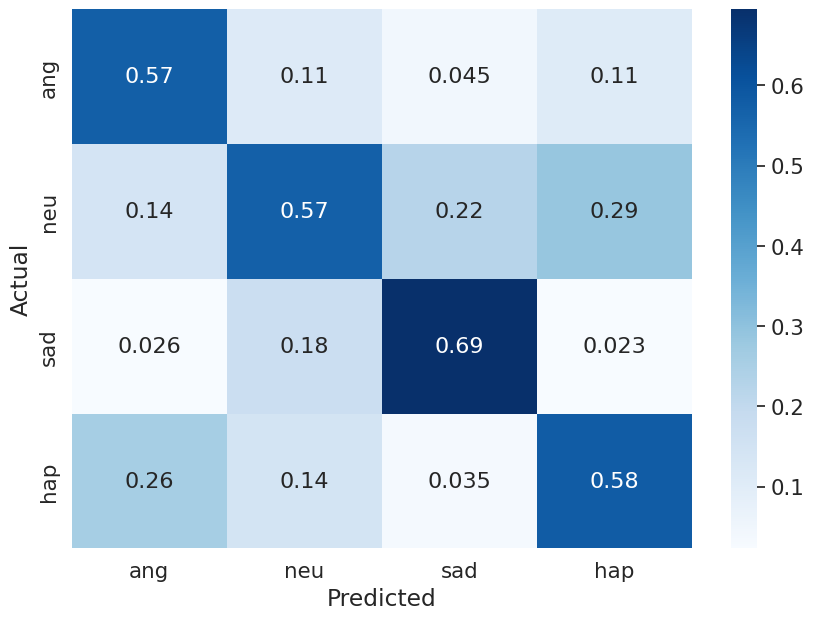

In [19]:
labels = dataset_config.target_labels
a = cm
# a /= reduce(a, 'y yh -> y 1', 'sum')
a = a / reduce(a, 'y yh -> 1 yh', 'sum')
df_cm = pd.DataFrame(a, columns=labels, index = labels )
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4) #for label size
sns.heatmap(
    df_cm, cmap="Blues", 
    annot=True,
    annot_kws={"size": 16})# font size

<Axes: xlabel='Predicted', ylabel='Actual'>

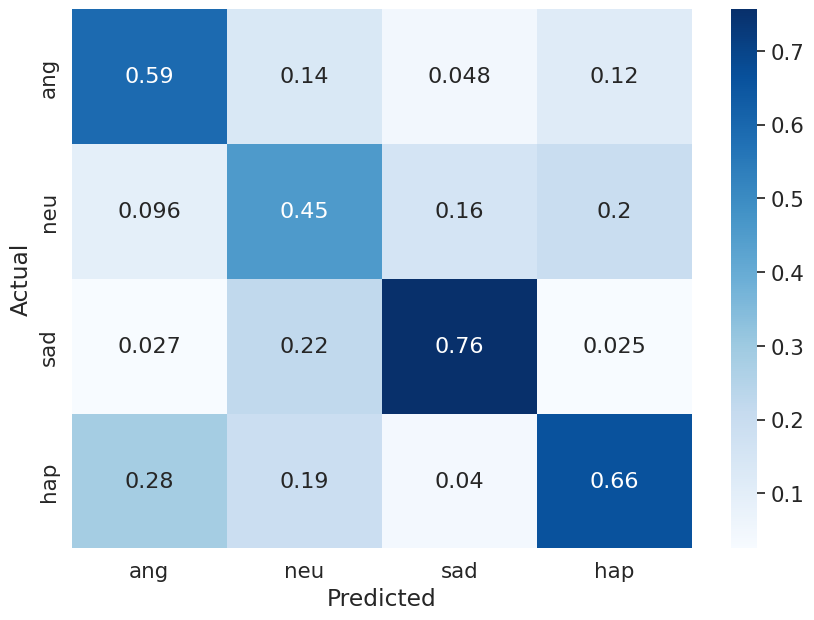

In [21]:
a = cm
a = a / reduce(a, 'y yh -> y 1', 'sum')
a = a / reduce(a, 'y yh -> 1 yh', 'sum')
df_cm = pd.DataFrame(a, columns=labels, index = labels )
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4) #for label size
sns.heatmap(
    df_cm, cmap="Blues", 
    annot=True,
    annot_kws={"size": 16})# font size

In [22]:
dt = []
for i, ld in enumerate(trainer.train_losses_detail):
    d = {'loss': trainer.train_losses[i]}
    for j, k in enumerate(ld._fields):
        d[k] = ld[j]
    dt.append(d)
loss_df = pd.DataFrame(dt)
loss_df

,loss,perplexity,loss_vq,loss_recon,loss_cls
0,245.982590,11.066589,245.600357,0.170578,1.410980
1,65.391937,8.171704,65.090027,0.093497,1.389418
2,81.328987,9.717851,80.989693,0.130540,1.391722
3,168.677521,11.940715,168.355255,0.119919,1.348981
4,14.886810,6.262682,14.556016,0.114080,1.444757
...,...,...,...,...,...
169816,24.108814,11.940715,23.939688,0.145961,0.154442
169817,41.905262,4.648985,41.695713,0.161719,0.318862
169818,31.985710,13.021441,31.780319,0.157803,0.317261
169819,50.846329,8.171704,50.549511,0.234675,0.414276


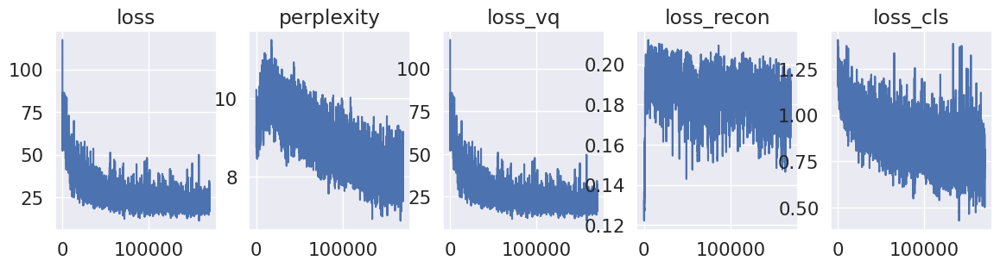

In [23]:
fig, axes = plt.subplots(1, 5, figsize=(14,3))
for i, c in enumerate(loss_df.columns):
    axes[i].plot(savgol_filter(loss_df[c], 301, 7))
    axes[i].set_title(c)

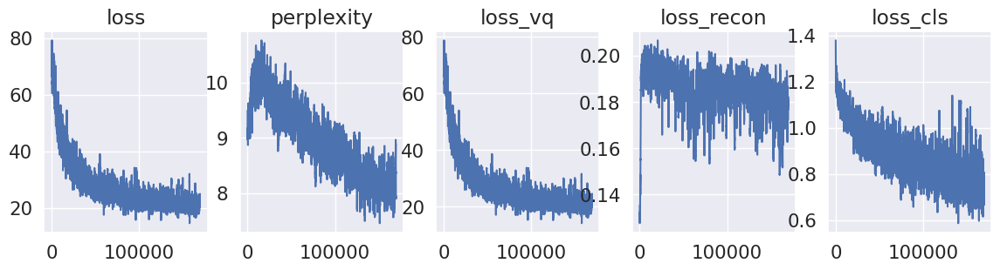

In [30]:
fig, axes = plt.subplots(1, 5, figsize=(14,3))
for i, c in enumerate(loss_df.columns):
    axes[i].plot(savgol_filter(loss_df[c], 400, 2))
    axes[i].set_title(c)

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

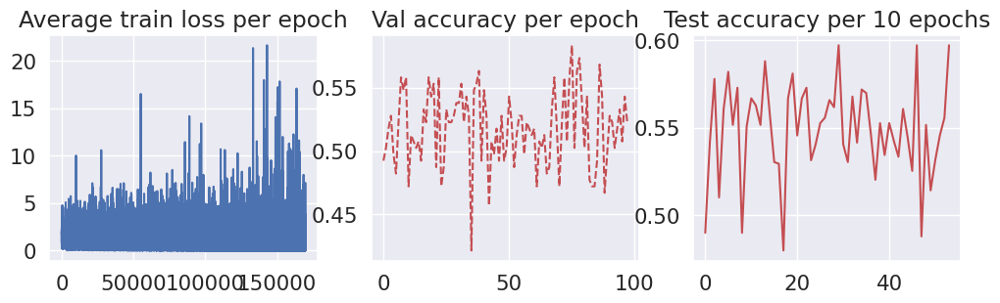

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(loss_df['loss_cls'].values, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(trainer.val_accuracy, color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

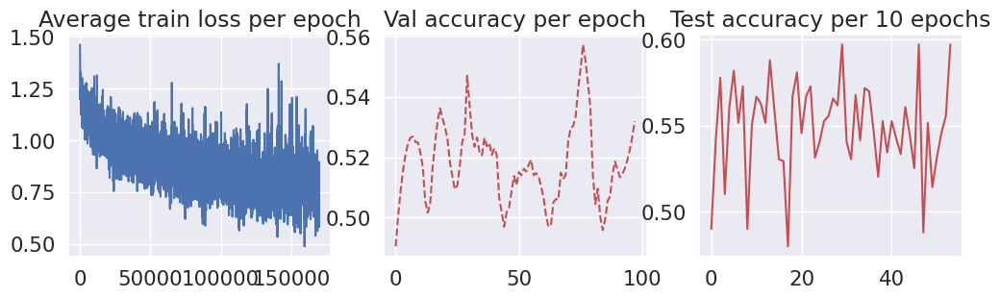

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(savgol_filter(loss_df['loss_cls'].values, 301, 5), color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 13, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

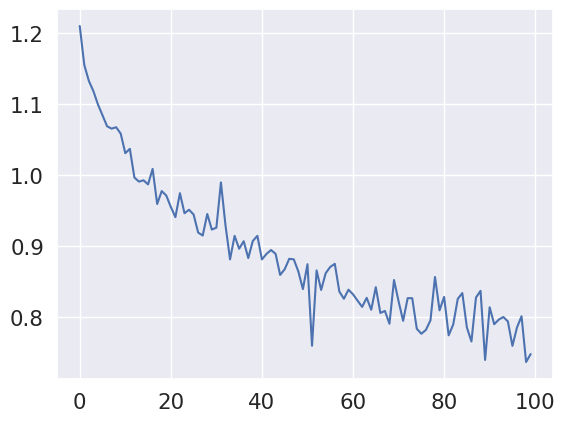

In [32]:
trained_epoch = trainer.current_epoch
n = len(trainer.train_losses)
trained_steps = n - (n % trained_epoch)
train_losses = reduce(np.array(
    trainer.train_losses[:trained_steps]), '(n k) -> n', 'mean', n=trained_epoch)
train_losses_cls = reduce(np.array(
    loss_df['loss_cls'].values[:trained_steps]), '(n k) -> n', 'mean', n=trained_epoch)
plt.plot(train_losses_cls)

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

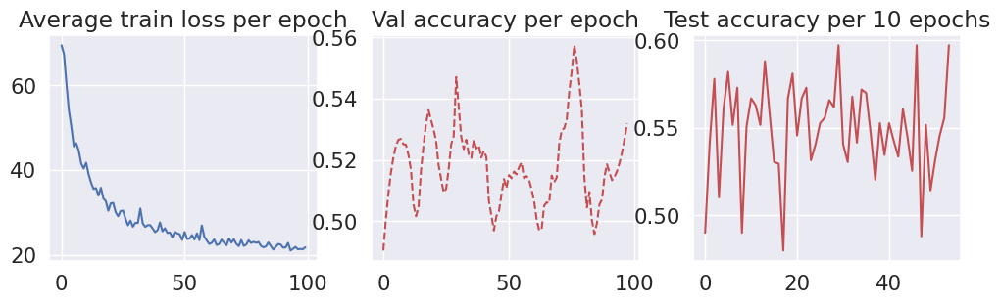

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(train_losses, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 13, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(trainer.test_accuracy, color="r")
axes[2].set_title("Test accuracy per 10 epochs")

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

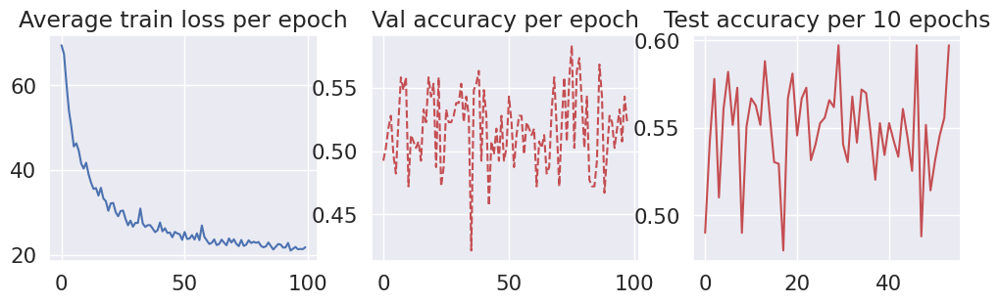

In [40]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(train_losses, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 3, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(savgol_filter(trainer.test_accuracy, 3, 2), color="r")
axes[2].set_title("Test accuracy per 10 epochs")

Text(0.5, 1.0, 'Test accuracy per 10 epochs')

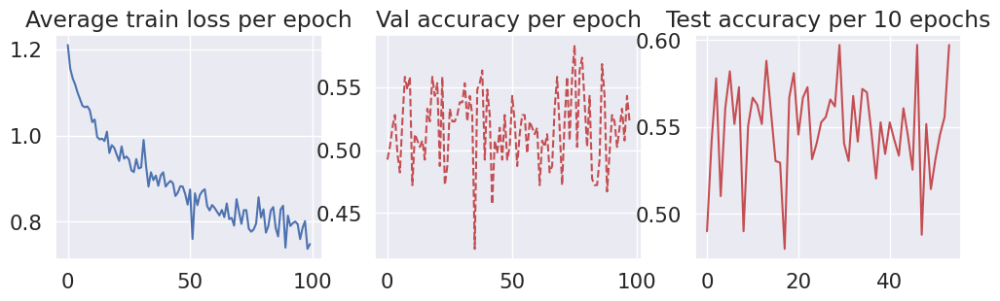

In [41]:
fig, axes = plt.subplots(1, 3, figsize=(12,3))
axes[0].plot(train_losses_cls, color="b")
axes[0].set_title("Average train loss per epoch")
axes[1].plot(savgol_filter(trainer.val_accuracy, 3, 2), color="r", linestyle="dashed")
axes[1].set_title("Val accuracy per epoch")
axes[2].plot(savgol_filter(trainer.test_accuracy, 3, 2), color="r")
axes[2].set_title("Test accuracy per 10 epochs")

In [42]:
train_log = {
    'train_loss': torch.tensor(train_losses),
    'train_loss_cls': torch.tensor(train_losses_cls),
    'val_acc': torch.tensor(trainer.val_accuracy),
    'test_acc': torch.tensor(trainer.test_accuracy),
    'test_confusion_matrix': cm,
    'test_metrics': me,
    'test_metrics_detail': med,
    'best_model_path': 'model.epoch=76.step=130087.test_acc=0.5972.pt'
}
torch.save(train_log, log_dir+"train_metrics.pt")

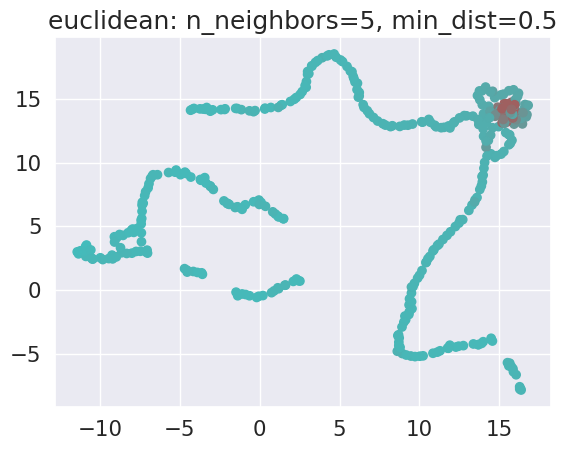

In [43]:
emb = model.embedding_filters.data.cpu()
emb_color, zcs = get_embedding_color_v2(emb)
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

In [44]:
torch.save(emb, log_dir + 'codebook.epoch=76.pt')

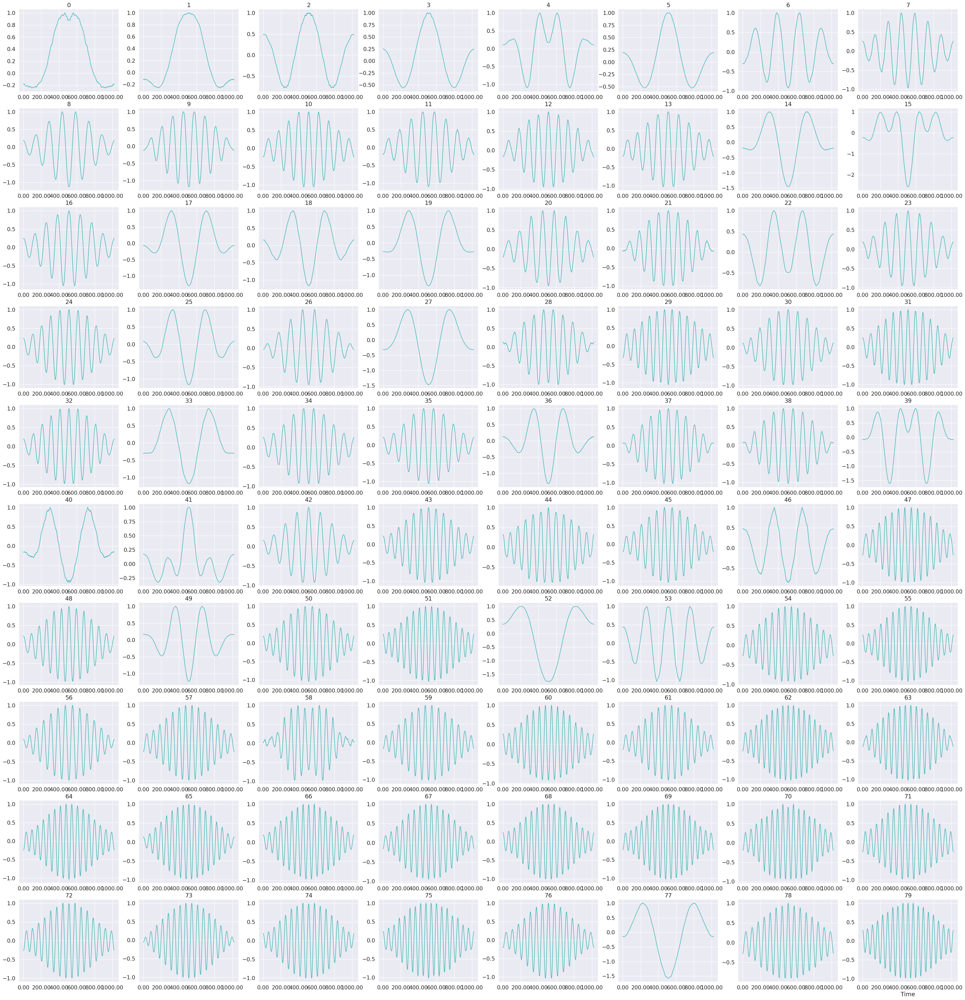

In [45]:
selected_emb_topk = torch.topk(zcs, 80)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

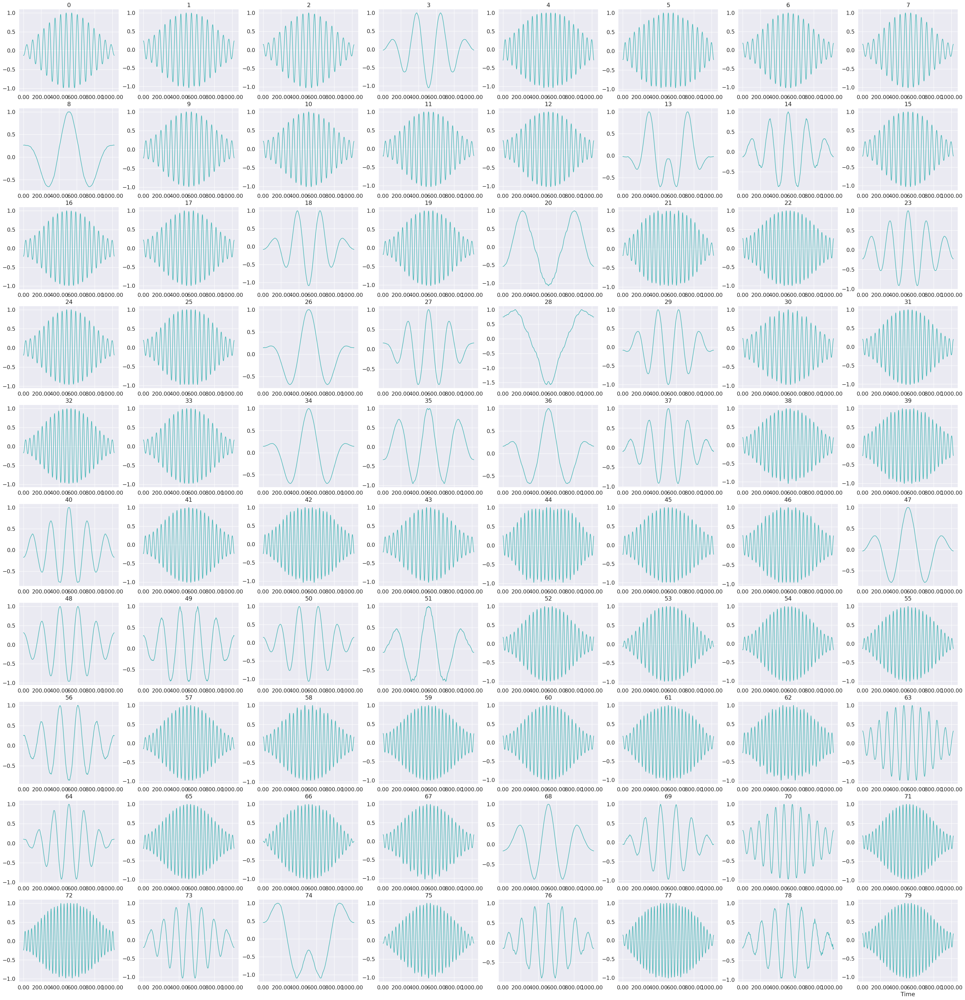

In [46]:
selected_emb_topk = torch.topk(zcs, 160)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

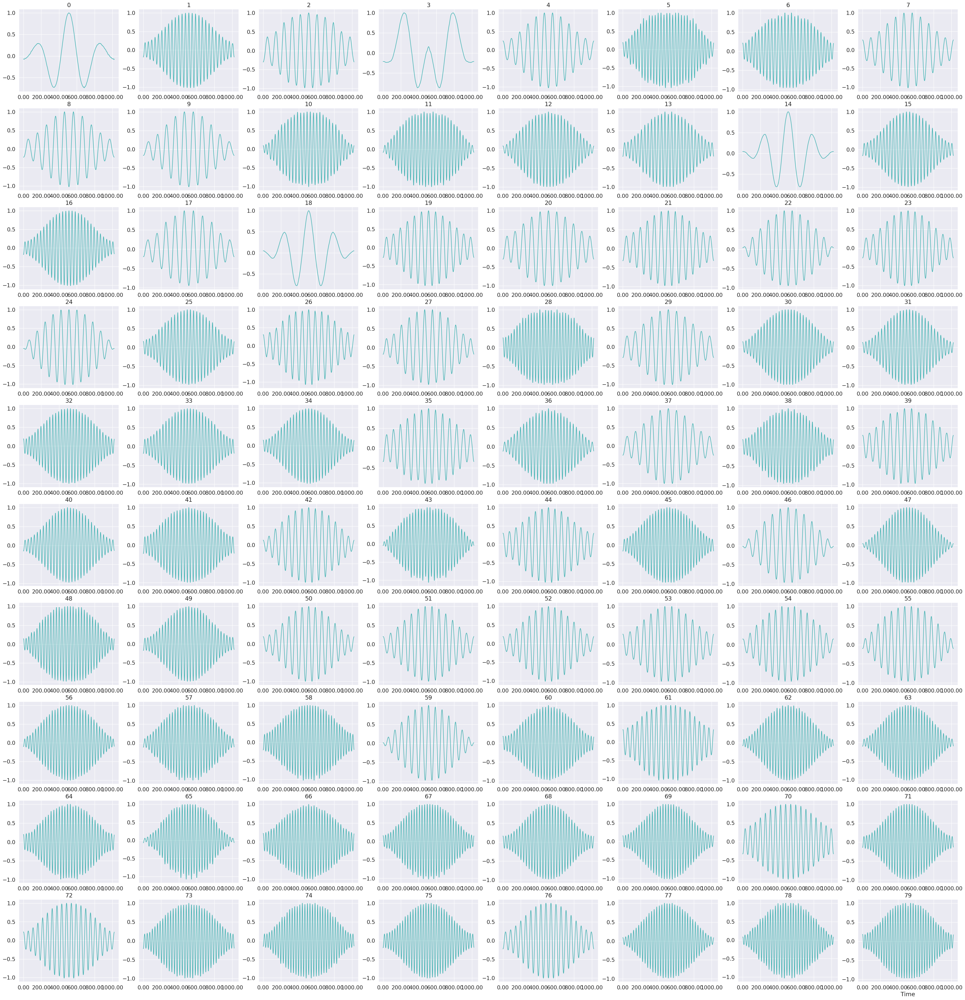

In [47]:
selected_emb_topk = torch.topk(zcs, 240)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

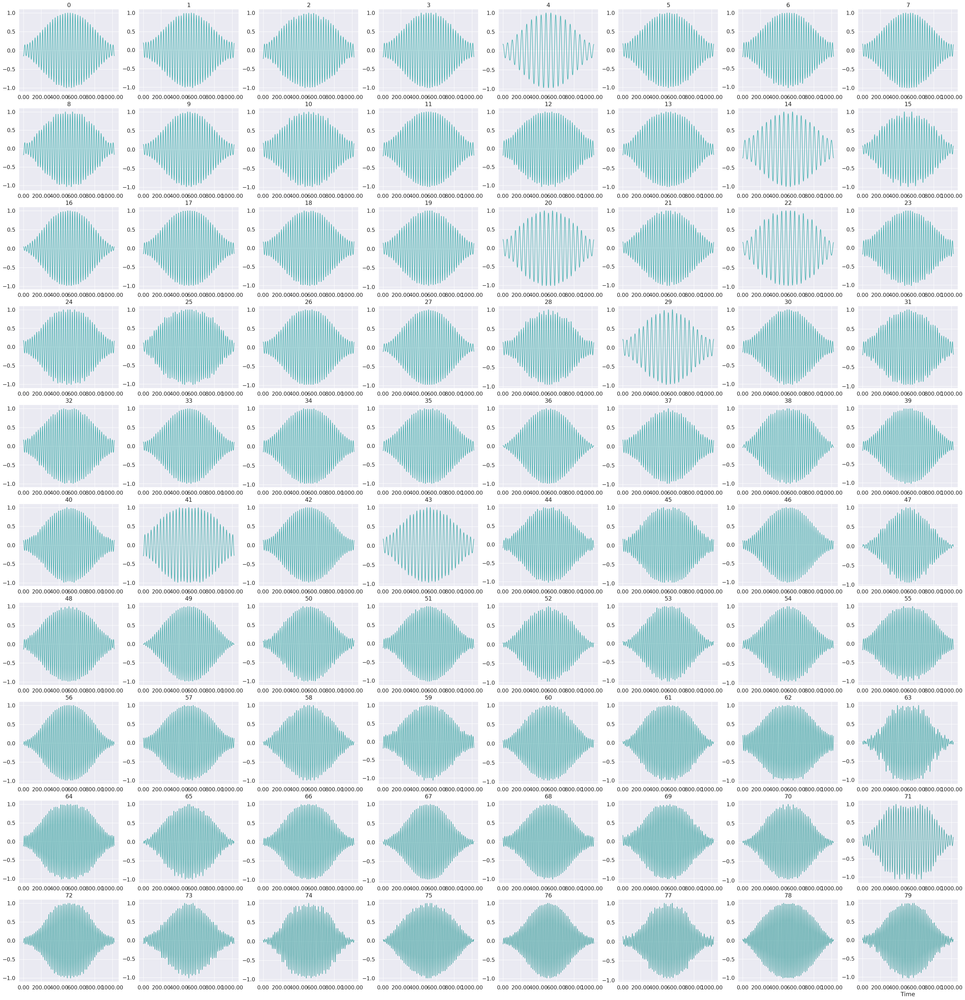

In [48]:
selected_emb_topk = torch.topk(zcs, 320)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

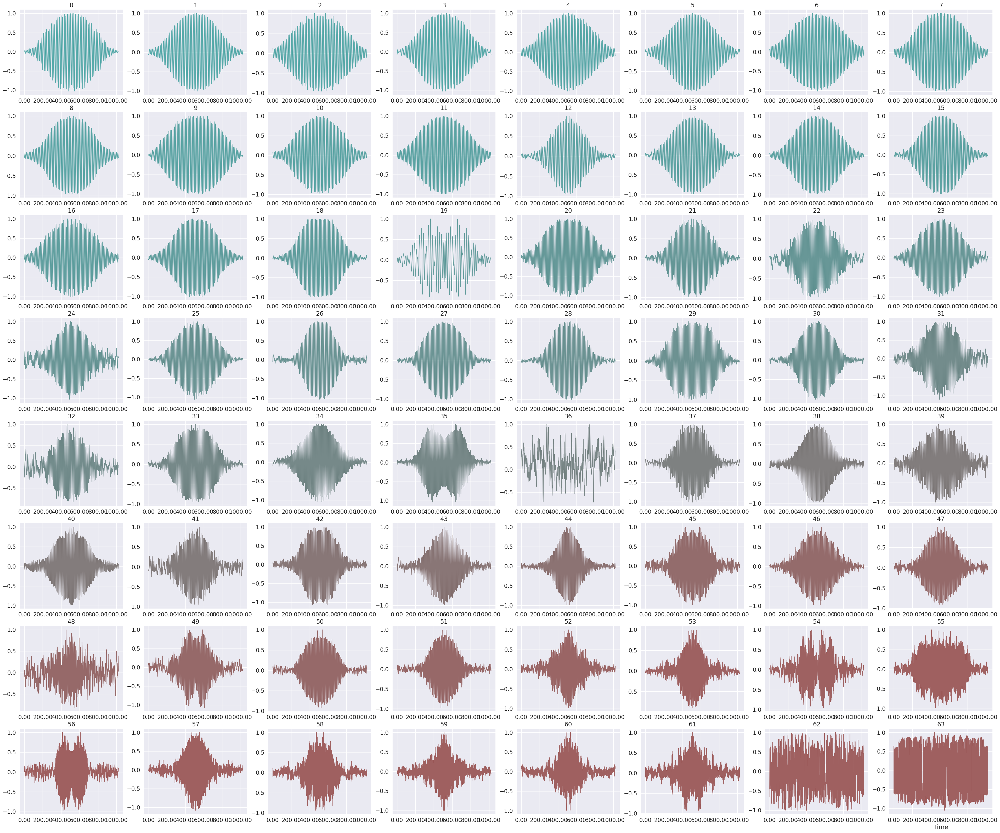

In [49]:
selected_emb_topk = torch.topk(zcs, 384)
selected_idx = selected_emb_topk.indices[-64:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=64, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)